# Indoor Scene Change Detection



## 1. Environment Setup

In [1]:
!pip install ultralytics pandas numpy scipy scikit-learn matplotlib seaborn opencv-python -q

import os, re, glob, json, shutil
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
from PIL import Image as PILImage
from IPython.display import Image as IPyImage, display
from google.colab import files
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

print("Libraries ready.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 38.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 9.2 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Libraries ready.


## 2. Upload Your Demo Reference/Query image Pair


Select the REFERENCE image:


Saving 0398-before-move-bottle-bedroom-cam-c1-b49-1.jpg to 0398-before-move-bottle-bedroom-cam-c1-b49-1.jpg
Saved -> /content/user_reference.jpg

Select the QUERY image:


Saving 0398-after-move-bottle-bedroom-cam-c1-b49-1.jpg to 0398-after-move-bottle-bedroom-cam-c1-b49-1.jpg
Saved -> /content/user_query.jpg



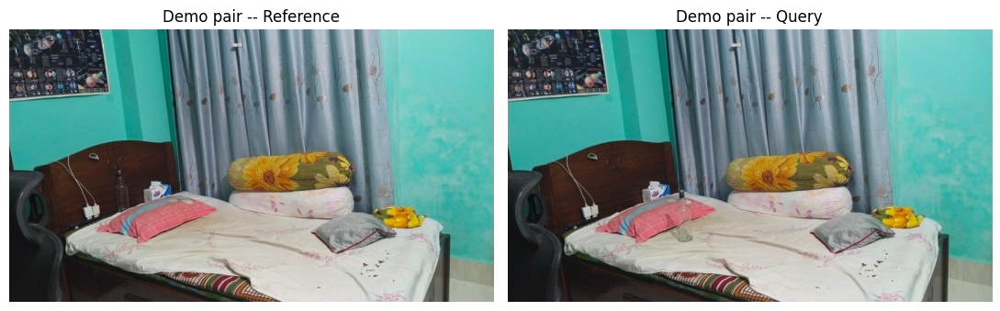

In [2]:
def upload_single_image(label):
    """Prompt the user to pick one image file (REFERENCE or QUERY) and save it under /content."""
    print(f"Select the {label} image:")
    uploaded = files.upload()
    assert len(uploaded) == 1, f"Please select exactly one {label} image."
    fname = next(iter(uploaded))
    ext = os.path.splitext(fname)[1] or '.jpg'
    dst = f'/content/user_{label.lower()}{ext}'
    with open(dst, 'wb') as f:
        f.write(uploaded[fname])
    print(f"Saved -> {dst}\n")
    return dst

USER_REFERENCE_PATH = upload_single_image('REFERENCE')
USER_QUERY_PATH  = upload_single_image('QUERY')

demo_reference_raw = cv2.cvtColor(cv2.imread(USER_REFERENCE_PATH), cv2.COLOR_BGR2RGB)
demo_query_raw  = cv2.cvtColor(cv2.imread(USER_QUERY_PATH),  cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.8))
axes[0].imshow(demo_reference_raw); axes[0].axis('off'); axes[0].set_title('Demo pair -- Reference', fontsize=12)
axes[1].imshow(demo_query_raw);  axes[1].axis('off'); axes[1].set_title('Demo pair -- Query', fontsize=12)
plt.tight_layout()
plt.show()

## 2. Load Dataset

In [3]:
if not os.path.exists('/content/data.zip'):
    print("Select data.zip from your computer:")
    uploaded = files.upload()
    assert 'data.zip' in uploaded, "Upload a file named exactly 'data.zip' (Label Studio YOLO export)."
else:
    print("/content/data.zip already present -- skipping upload.")

/content/data.zip already present -- skipping upload.


In [4]:
!unzip -qo /content/data.zip -d /content/custom_data
!ls -la /content/custom_data

total 448
drwxr-xr-x 4 root root   4096 Sep 24 13:02 .
drwxr-xr-x 1 root root   4096 Sep 24 13:02 ..
-rw-rw-rw- 1 root root    420 Sep  5 23:01 classes.txt
drwxr-xr-x 2 root root 225280 Sep 24 13:02 images
drwxr-xr-x 2 root root 208896 Sep 24 13:02 labels
-rw-rw-rw- 1 root root   3221 Sep  5 23:01 notes.json


In [5]:
required = ['images', 'labels', 'classes.txt']
missing = [r for r in required if not os.path.exists(f'/content/custom_data/{r}')]
if missing:
    raise FileNotFoundError(f"Missing {missing} in /content/custom_data -- check the zip's folder structure.")
print("Folder structure looks correct.")

Folder structure looks correct.


## 3. Exploratory Data Analysis — Raw Images

In [6]:
RAW_IMAGE_DIR = '/content/custom_data/images'
RAW_LABEL_DIR = '/content/custom_data/labels'
CLASSES_TXT   = '/content/custom_data/classes.txt'

raw_images = sorted(glob.glob(os.path.join(RAW_IMAGE_DIR, '*.jpg')) +
                     glob.glob(os.path.join(RAW_IMAGE_DIR, '*.png')))
raw_labels = sorted(glob.glob(os.path.join(RAW_LABEL_DIR, '*.txt')))

with open(CLASSES_TXT) as f:
    class_names = [l.strip() for l in f if l.strip()]

print(f"Images found : {len(raw_images)}")
print(f"Label files  : {len(raw_labels)}")
print(f"Classes ({len(class_names)}): {class_names}")

images_without_labels = [
    p for p in raw_images
    if not os.path.exists(os.path.join(RAW_LABEL_DIR, os.path.splitext(os.path.basename(p))[0] + '.txt'))
]
print(f"Images with no matching label file: {len(images_without_labels)}")

Images found : 2034
Label files  : 2034
Classes (56): ['Bag', 'Basket', 'Blanket', 'Blender', 'Book', 'Bottle', 'Bowl', 'Box', 'Bucket', 'Chair', 'Clock', 'Cooker', 'Cup', 'Door', 'Drawer', 'Electric Iron', 'Fan', 'Floor Mat', 'Food', 'Footwear', 'Glass', 'Jar', 'Jug', 'Kettle', 'Keyboard', 'Keychain', 'Knife', 'Laptop', 'Light', 'Lock', 'Mirror', 'Moneybag', 'Monitor', 'Mop', 'Mouse', 'Mug', 'Notebook', 'Pan', 'Pen Stand', 'Phone', 'Photo', 'Pillow', 'Plant', 'Plate', 'Pot', 'Rack', 'Remote', 'Soap', 'Spoon', 'Stool', 'Table', 'Table Lamp', 'Towel', 'Tray', 'Umbrella', 'Window']
Images with no matching label file: 143


Image size / file-size summary (sampled):


,width,height,file_kb,aspect_ratio
count,300.000000,300.000000,300.000000,300.000000
mean,1818.706667,1074.510000,196.855163,1.705362
std,311.929298,154.292917,61.704992,0.228279
min,899.000000,720.000000,95.295898,0.561979
25%,1920.000000,1080.000000,155.279053,1.777778
50%,1920.000000,1080.000000,191.665527,1.777778
75%,1920.000000,1080.000000,220.842773,1.777778
max,3840.000000,2160.000000,676.202148,1.777778


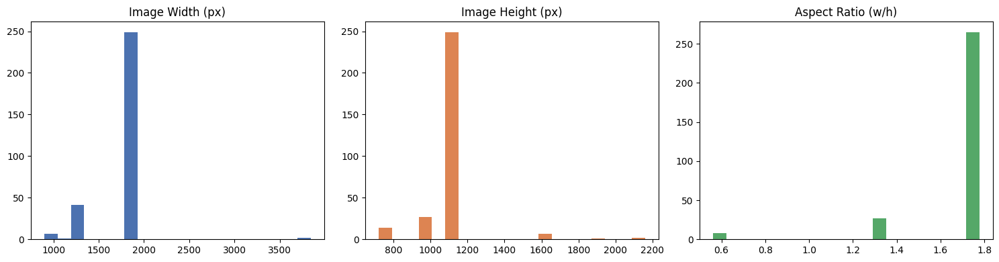

In [7]:
sample_n = min(300, len(raw_images))
rng = np.random.default_rng(42)
sample_paths = rng.choice(raw_images, size=sample_n, replace=False)

dims, file_sizes = [], []
for p in sample_paths:
    with PILImage.open(p) as im:
        dims.append(im.size)  # (w, h)
    file_sizes.append(os.path.getsize(p) / 1024)  # KB

widths, heights = zip(*dims)
dim_df = pd.DataFrame({'width': widths, 'height': heights, 'file_kb': file_sizes})
dim_df['aspect_ratio'] = dim_df['width'] / dim_df['height']

print("Image size / file-size summary (sampled):")
display(dim_df.describe())

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].hist(dim_df['width'], bins=20, color='#4C72B0'); axes[0].set_title('Image Width (px)')
axes[1].hist(dim_df['height'], bins=20, color='#DD8452'); axes[1].set_title('Image Height (px)')
axes[2].hist(dim_df['aspect_ratio'], bins=20, color='#55A868'); axes[2].set_title('Aspect Ratio (w/h)')
plt.tight_layout()
plt.show()

Object instances per class (raw labels):


,class,instances,pct_of_total
0,Pillow,988,6.6
1,Jar,974,6.5
2,Table,960,6.4
3,Chair,910,6.1
4,Bottle,790,5.3
5,Door,667,4.4
6,Pot,554,3.7
7,Book,552,3.7
8,Window,475,3.2
9,Footwear,466,3.1


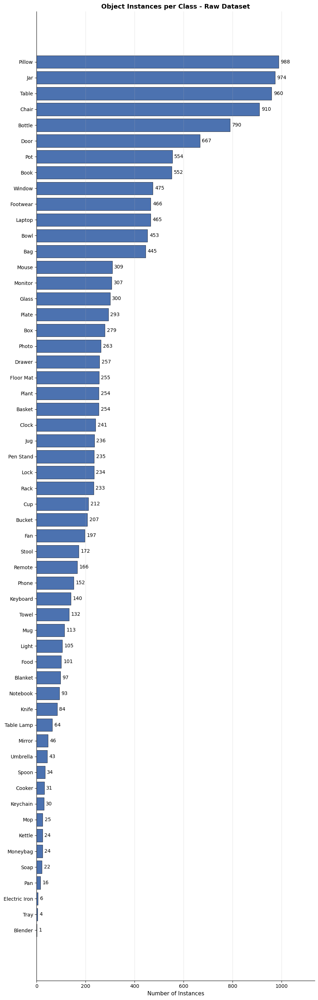

In [8]:
class_counts = {c: 0 for c in class_names}
boxes_per_image = []

for lp in raw_labels:
    with open(lp) as f:
        lines = [l.strip() for l in f if l.strip()]
    boxes_per_image.append(len(lines))
    for line in lines:
        cls_id = int(line.split()[0])
        if 0 <= cls_id < len(class_names):
            class_counts[class_names[cls_id]] += 1

class_count_df = pd.Series(class_counts).sort_values(ascending=False)
total_instances = class_count_df.sum()

report_table = pd.DataFrame({
    'class': class_count_df.index,
    'instances': class_count_df.values,
    'pct_of_total': (class_count_df.values / total_instances * 100).round(1)
})
print("Object instances per class (raw labels):")
display(report_table)

plot_order = class_count_df.sort_values(ascending=True)
fig, ax = plt.subplots(figsize=(9, max(3.5, 0.5 * len(plot_order))))
bars = ax.barh(plot_order.index, plot_order.values, color='#4C72B0', edgecolor='black', linewidth=0.5)
ax.bar_label(bars, padding=4, fontsize=10)
ax.set_xlim(0, plot_order.max() * 1.15)
ax.set_xlabel('Number of Instances', fontsize=11)
ax.set_title('Object Instances per Class - Raw Dataset', fontsize=13, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
plt.tight_layout()
plt.savefig('/content/class_distribution_raw.png', dpi=300, bbox_inches='tight')
plt.show()

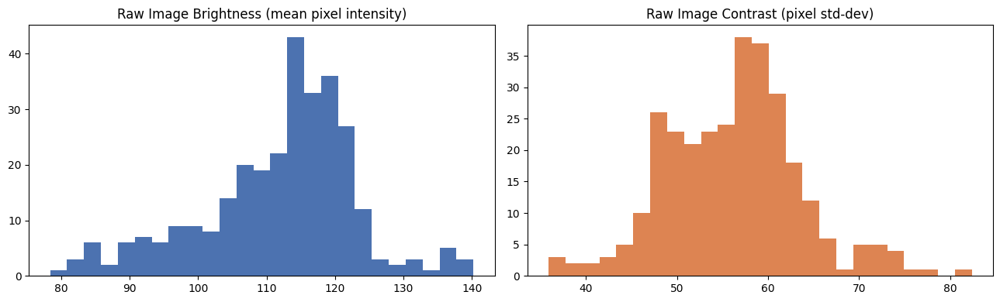

Mean brightness: 111.9  |  Mean contrast: 56.3


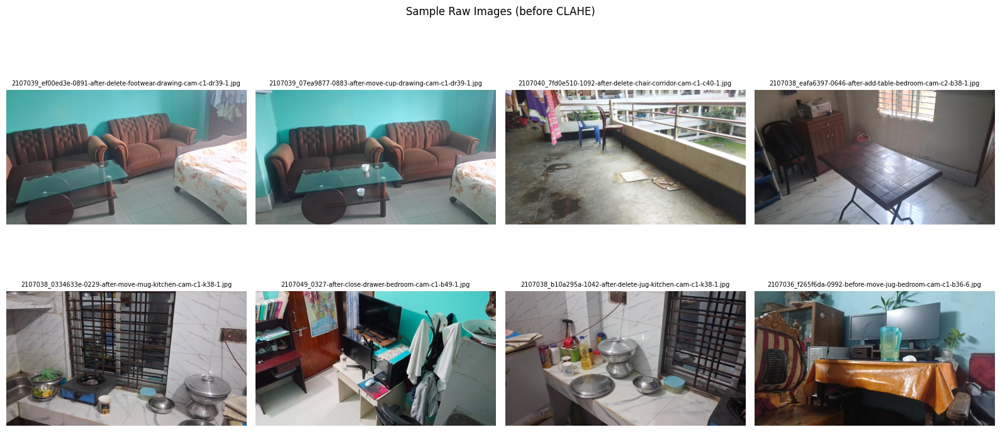

In [9]:
def image_brightness_contrast(path):
    img = cv2.imread(path)
    if img is None:
        return None, None
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return gray.mean(), gray.std()

bright_vals, contrast_vals = [], []
for p in sample_paths:
    b, c = image_brightness_contrast(p)
    if b is not None:
        bright_vals.append(b); contrast_vals.append(c)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].hist(bright_vals, bins=25, color='#4C72B0')
axes[0].set_title('Raw Image Brightness (mean pixel intensity)')
axes[1].hist(contrast_vals, bins=25, color='#DD8452')
axes[1].set_title('Raw Image Contrast (pixel std-dev)')
plt.tight_layout()
plt.show()

print(f"Mean brightness: {np.mean(bright_vals):.1f}  |  Mean contrast: {np.mean(contrast_vals):.1f}")

# Sample grid of raw images
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for ax, p in zip(axes.ravel(), rng.choice(raw_images, size=8, replace=False)):
    img = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
    ax.imshow(img); ax.set_title(os.path.basename(p), fontsize=7); ax.axis('off')
plt.suptitle('Sample Raw Images (before CLAHE)')
plt.tight_layout()
plt.show()

## 4. Preprocessing — CLAHE

### 4a. Apply CLAHE (originals are backed up to `images_original/`)

In [10]:
def equalize_clahe(img_bgr, clip_limit=2.5, tile_grid_size=(8, 8)):
    """BGR image -> BGR image, CLAHE applied to the lightness channel only (colour preserved)."""
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_eq = clahe.apply(l)
    lab_eq = cv2.merge((l_eq, a, b))
    return cv2.cvtColor(lab_eq, cv2.COLOR_LAB2BGR)

CLAHE_CLIP_LIMIT = 2.5
CLAHE_TILE_GRID = (8, 8)
ORIG_BACKUP_DIR = '/content/custom_data/images_original'

def preprocess_dataset_histogram_eq(image_dir, clip_limit=CLAHE_CLIP_LIMIT,
                                     tile_grid_size=CLAHE_TILE_GRID, backup=True):
    """Equalize every image in image_dir in place. Originals are copied to <image_dir>_original first; if that backup already exists the step is skipped so CLAHE is never applied twice."""
    paths = glob.glob(os.path.join(image_dir, '*.jpg')) + glob.glob(os.path.join(image_dir, '*.png'))
    if not paths:
        print(f"No images found in {image_dir} -- nothing to equalize.")
        return

    if backup:
        backup_dir = image_dir.rstrip('/') + '_original'
        if not os.path.exists(backup_dir):
            os.makedirs(backup_dir)
            for p in paths:
                shutil.copy2(p, os.path.join(backup_dir, os.path.basename(p)))
            print(f"Backed up {len(paths)} original images to {backup_dir}")
        else:
            print(f"Backup dir {backup_dir} already exists -- skipping backup "
                  f"(assuming equalization already ran once; re-running would double-apply CLAHE).")
            return

    n_ok, n_fail = 0, 0
    for p in paths:
        img = cv2.imread(p)
        if img is None:
            n_fail += 1
            continue
        eq = equalize_clahe(img, clip_limit=clip_limit, tile_grid_size=tile_grid_size)
        cv2.imwrite(p, eq)
        n_ok += 1
    print(f"Histogram-equalized {n_ok} images in place in {image_dir} ({n_fail} unreadable/skipped).")

preprocess_dataset_histogram_eq('/content/custom_data/images')

# CLAHE-preprocessed version of the single demo pair uploaded above (in-memory + saved to disk),
# reused by every gallery/section below instead of looping over several dataset pairs.
demo_reference_bgr = cv2.imread(USER_REFERENCE_PATH)
demo_query_bgr  = cv2.imread(USER_QUERY_PATH)
demo_reference_pre = equalize_clahe(demo_reference_bgr, CLAHE_CLIP_LIMIT, CLAHE_TILE_GRID)
demo_query_pre  = equalize_clahe(demo_query_bgr,  CLAHE_CLIP_LIMIT, CLAHE_TILE_GRID)

DEMO_REFERENCE_PRE_PATH = '/content/user_reference_clahe.jpg'
DEMO_QUERY_PRE_PATH  = '/content/user_query_clahe.jpg'
cv2.imwrite(DEMO_REFERENCE_PRE_PATH, demo_reference_pre)
cv2.imwrite(DEMO_QUERY_PRE_PATH, demo_query_pre)
print('CLAHE applied to the demo pair ->', DEMO_REFERENCE_PRE_PATH, DEMO_QUERY_PRE_PATH)

Backed up 2034 original images to /content/custom_data/images_original
Histogram-equalized 2034 images in place in /content/custom_data/images (0 unreadable/skipped).
CLAHE applied to the demo pair -> /content/user_reference_clahe.jpg /content/user_query_clahe.jpg


### 4b. EDA Query Preprocessing

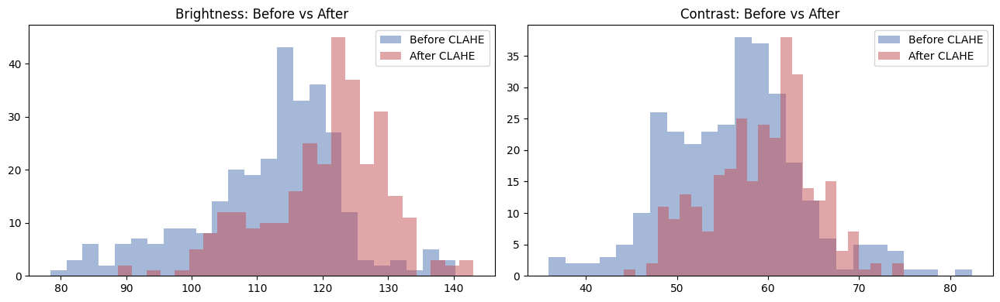

Mean brightness  -> before CLAHE: 111.9, after CLAHE: 120.4
Mean contrast    -> before CLAHE: 56.3, after CLAHE: 59.4


In [11]:
bright_after, contrast_after = [], []
for p in sample_paths:
    b, c = image_brightness_contrast(p)   # sample_paths now point at the equalized files
    if b is not None:
        bright_after.append(b); contrast_after.append(c)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].hist(bright_vals, bins=25, alpha=0.5, label='Before CLAHE', color='#4C72B0')
axes[0].hist(bright_after, bins=25, alpha=0.5, label='After CLAHE', color='#C44E52')
axes[0].set_title('Brightness: Before vs After'); axes[0].legend()

axes[1].hist(contrast_vals, bins=25, alpha=0.5, label='Before CLAHE', color='#4C72B0')
axes[1].hist(contrast_after, bins=25, alpha=0.5, label='After CLAHE', color='#C44E52')
axes[1].set_title('Contrast: Before vs After'); axes[1].legend()
plt.tight_layout()
plt.show()

print(f"Mean brightness  -> before CLAHE: {np.mean(bright_vals):.1f}, after CLAHE: {np.mean(bright_after):.1f}")
print(f"Mean contrast    -> before CLAHE: {np.mean(contrast_vals):.1f}, after CLAHE: {np.mean(contrast_after):.1f}")

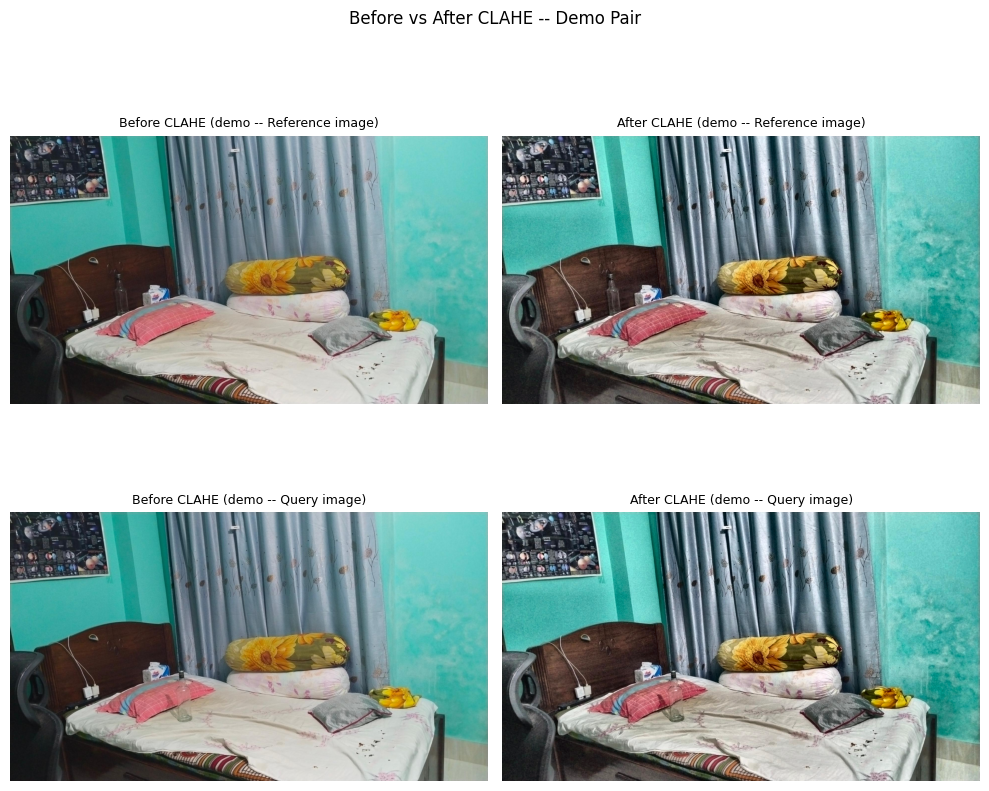

In [12]:
demo_reference_pre_rgb = cv2.cvtColor(demo_reference_pre, cv2.COLOR_BGR2RGB)
demo_query_pre_rgb  = cv2.cvtColor(demo_query_pre,  cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(2, 2, figsize=(10, 9))
axes[0, 0].imshow(demo_reference_raw);     axes[0, 0].set_title('Before CLAHE (demo -- Reference image)', fontsize=9); axes[0, 0].axis('off')
axes[0, 1].imshow(demo_reference_pre_rgb); axes[0, 1].set_title('After CLAHE (demo -- Reference image)', fontsize=9);  axes[0, 1].axis('off')
axes[1, 0].imshow(demo_query_raw);      axes[1, 0].set_title('Before CLAHE (demo -- Query image)', fontsize=9);  axes[1, 0].axis('off')
axes[1, 1].imshow(demo_query_pre_rgb);  axes[1, 1].set_title('After CLAHE (demo -- Query image)', fontsize=9);   axes[1, 1].axis('off')
plt.suptitle('Before vs After CLAHE -- Demo Pair')
plt.tight_layout()
plt.show()

## 5. Pair-Level Train / Validation / Test Split (70 / 15 / 15)

In [13]:
IMAGE_DIR = '/content/custom_data/images'
LABEL_DIR = '/content/custom_data/labels'

ALL_IMAGES = glob.glob(os.path.join(IMAGE_DIR, '*.jpg')) + glob.glob(os.path.join(IMAGE_DIR, '*.png'))
print(f"Found {len(ALL_IMAGES)} images in {IMAGE_DIR}")

CHANGE_TYPES = ['add', 'delete', 'move']
KNOWN_ROOMS = ['bedroom', 'kitchen', 'dining', 'corridor', 'drawing']

FILENAME_PATTERN = re.compile(
    r'(?P<pair_id>\d+)-(?P<stage>before|after)-(?P<change_type>' + '|'.join(CHANGE_TYPES) + r')-'
    r'(?P<object>.+?)-(?P<room>' + '|'.join(KNOWN_ROOMS) + r')-cam-'
    r'(?P<camera_id>[^-]+)-(?P<member_roll>[^-]+)-(?P<seq>\d+)',
    re.IGNORECASE
)

def parse_filename(path):
    stem = os.path.splitext(os.path.basename(path))[0]
    m = FILENAME_PATTERN.search(stem)
    if not m:
        return None
    d = m.groupdict()
    d['path'] = path
    d['stage'] = d['stage'].lower()
    d['change_type'] = d['change_type'].lower()
    return d

parsed = [p for p in (parse_filename(f) for f in ALL_IMAGES) if p is not None]
skipped_files = [f for f in ALL_IMAGES if parse_filename(f) is None]
if skipped_files:
    print(f"NOTE: {len(skipped_files)} filenames didn't match add/delete/move and were dropped")
    print("(this includes any open/close/on/off pairs, plus any genuinely malformed names).")
    print("First 5 examples:")
    for f in skipped_files[:5]:
        print(" ", os.path.basename(f))

meta_df = pd.DataFrame(parsed)
print(f"\nKept {len(meta_df)} images with change_type in {CHANGE_TYPES}.")
meta_df.head()

Found 2034 images in /content/custom_data/images
NOTE: 76 filenames didn't match add/delete/move and were dropped
(this includes any open/close/on/off pairs, plus any genuinely malformed names).
First 5 examples:
  2107040_18cbf8d1-1096-before-on-door-corridor-cam-c1-c40-1.jpg
  2107036_13ebb780-0627-after-off-laptop-bedroom-cam-c1-b36-4.jpg
  2107049_0353-after-open-door-bedroom-cam-c1-b49-1.jpg
  2107049_0385-before-open-window-bedroom-cam-c1-b49-1.jpg
  2107060_84165a2e-0804-before-off-light-drawing-cam-c2-d60-2.jpg

Kept 1958 images with change_type in ['add', 'delete', 'move'].


,pair_id,stage,change_type,object,room,camera_id,member_roll,seq,path
0,0167,after,move,stool,bedroom,c2,b38,1,/content/custom_data/images/2107038_77b9f7a5-0...
1,0434,after,delete,mop,bedroom,c1,b36,2,/content/custom_data/images/2107036_d9af7831-0...
2,0301,before,add,fan,bedroom,c1,b37,1,/content/custom_data/images/2107037_c90670b5-0...
3,0138,after,delete,jug,bedroom,c1,b38,1,/content/custom_data/images/2107038_8060b50b-0...
4,0626,after,delete,glass,bedroom,c1,b36,3,/content/custom_data/images/2107036_ad0fa038-0...


In [14]:
_pairs = []
_bad_pairs = []
for pid, grp in meta_df.groupby('pair_id'):
    references = grp[grp['stage'] == 'before']
    queries = grp[grp['stage'] == 'after']
    if len(references) != 1 or len(queries) != 1:
        _bad_pairs.append((pid, len(references), len(queries)))
        continue
    b, a = references.iloc[0], queries.iloc[0]
    _pairs.append({
        'pair_id': pid, 'reference_path': b['path'], 'query_path': a['path'],
        'change_type': a['change_type'], 'object': a['object'], 'room': a['room'],
    })
if _bad_pairs:
    print(f"WARNING: {len(_bad_pairs)} pair_ids didn't have exactly 1 reference + 1 query file -- skipped:")
    for pid, nb_, na_ in _bad_pairs[:10]:
        print(f"  pair_id={pid}: {nb_} reference, {na_} query")

ALL_PAIRS_DF = pd.DataFrame(_pairs)
print(f"Built {len(ALL_PAIRS_DF)} total reference/query pairs (Add/Delete/Move only).")

TRAIN_FRAC, VAL_FRAC, TEST_FRAC = 0.70, 0.15, 0.15
assert abs(TRAIN_FRAC + VAL_FRAC + TEST_FRAC - 1.0) < 1e-9

_labels = ALL_PAIRS_DF['change_type']
_min_class_count = _labels.value_counts().min()
_stratify_ok = _min_class_count >= 2

train_ids, temp_ids = train_test_split(
    ALL_PAIRS_DF['pair_id'], train_size=TRAIN_FRAC, random_state=42,
    stratify=_labels if _stratify_ok else None)

temp_labels = ALL_PAIRS_DF.set_index('pair_id').loc[temp_ids, 'change_type']
_temp_stratify_ok = temp_labels.value_counts().min() >= 2
val_ids, test_ids = train_test_split(
    temp_ids, train_size=VAL_FRAC / (VAL_FRAC + TEST_FRAC), random_state=42,
    stratify=temp_labels if _temp_stratify_ok else None)

split_map = {pid: 'train' for pid in train_ids}
split_map.update({pid: 'validation' for pid in val_ids})
split_map.update({pid: 'test' for pid in test_ids})
ALL_PAIRS_DF['split'] = ALL_PAIRS_DF['pair_id'].map(split_map)

print("\nSplit sizes (pairs):")
print(ALL_PAIRS_DF['split'].value_counts())
print("\nChange-type balance across splits:")
print(ALL_PAIRS_DF.groupby('split')['change_type'].value_counts().unstack(fill_value=0))

  pair_id=0190: 2 reference, 2 query
  pair_id=0211: 2 reference, 2 query
  pair_id=0245: 2 reference, 2 query
  pair_id=0296: 2 reference, 2 query
  pair_id=0332: 2 reference, 2 query
  pair_id=0416: 2 reference, 1 query
  pair_id=0417: 2 reference, 2 query
  pair_id=0418: 2 reference, 1 query
  pair_id=0419: 2 reference, 2 query
  pair_id=0421: 1 reference, 2 query
Built 915 total reference/query pairs (Add/Delete/Move only).

Split sizes (pairs):
split
train         640
test          138
validation    137
Name: count, dtype: int64

Change-type balance across splits:
change_type  add  delete  move
split                         
test          50      43    45
train        232     199   209
validation    50      43    44


In [15]:
DATA_ROOT = '/content/data'
shutil.rmtree(DATA_ROOT, ignore_errors=True)   # start clean so a re-run never mixes old and new splits
missing_labels = []

def _copy_one(img_path, split):
    img_name = os.path.basename(img_path)
    stem = os.path.splitext(img_name)[0]
    dst_img_dir = os.path.join(DATA_ROOT, split, 'images')
    dst_lbl_dir = os.path.join(DATA_ROOT, split, 'labels')
    os.makedirs(dst_img_dir, exist_ok=True)
    os.makedirs(dst_lbl_dir, exist_ok=True)
    shutil.copy2(img_path, os.path.join(dst_img_dir, img_name))
    label_src = os.path.join(LABEL_DIR, stem + '.txt')
    if os.path.exists(label_src):
        shutil.copy2(label_src, os.path.join(dst_lbl_dir, stem + '.txt'))
    else:
        missing_labels.append(img_name)

for _, row in ALL_PAIRS_DF.iterrows():
    _copy_one(row['reference_path'], row['split'])
    _copy_one(row['query_path'], row['split'])

if missing_labels:
    print(f"WARNING: {len(missing_labels)} images had no matching .txt label file -- "
          f"first 5: {missing_labels[:5]}")

print("Images copied per split:")
for split in ['train', 'validation', 'test']:
    n_img = len(glob.glob(f'{DATA_ROOT}/{split}/images/*'))
    n_lbl = len(glob.glob(f'{DATA_ROOT}/{split}/labels/*'))
    print(f"  {split}: {n_img} images, {n_lbl} labels")
    if n_img == 0:
        raise RuntimeError(f"{split} folder is empty -- check the split/copy logic above.")

Images copied per split:
  train: 1280 images, 1185 labels
  validation: 274 images, 264 labels
  test: 276 images, 262 labels


### 5b. Dataset distribution charts

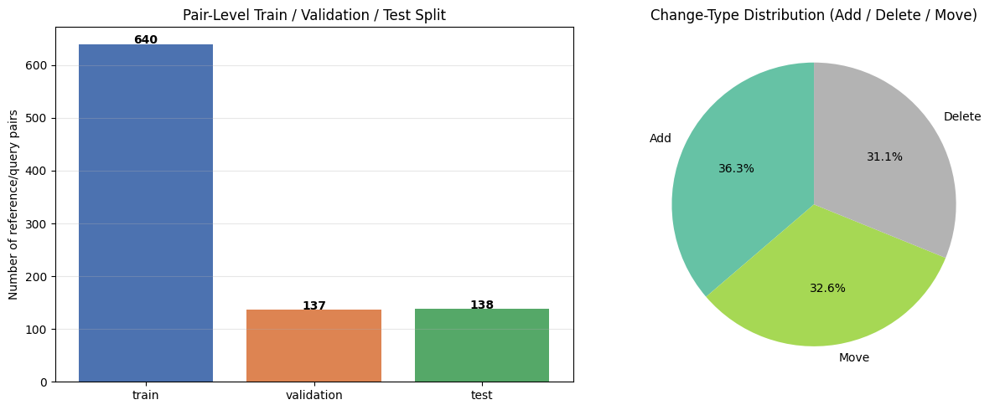

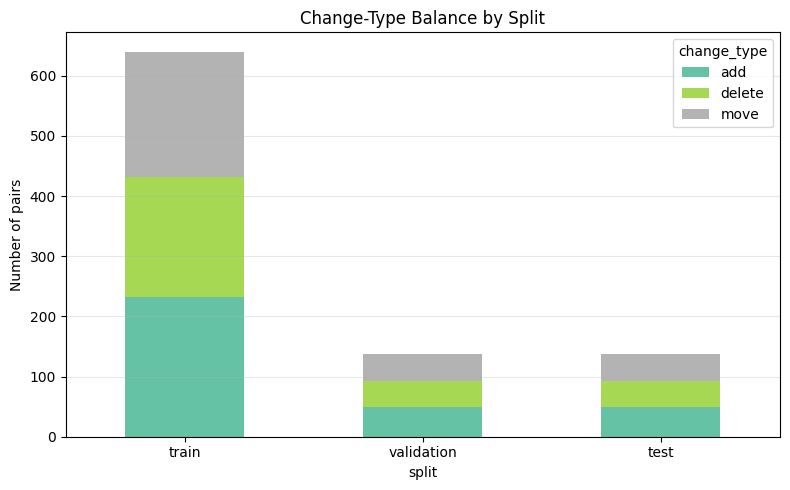

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

split_counts = ALL_PAIRS_DF['split'].value_counts().reindex(['train', 'validation', 'test'])
axes[0].bar(split_counts.index, split_counts.values, color=['#4C72B0', '#DD8452', '#55A868'])
for i, v in enumerate(split_counts.values):
    axes[0].text(i, v + 0.5, str(int(v)), ha='center', fontweight='bold')
axes[0].set_title('Pair-Level Train / Validation / Test Split')
axes[0].set_ylabel('Number of reference/query pairs')
axes[0].grid(alpha=0.3, axis='y')

type_counts = ALL_PAIRS_DF['change_type'].value_counts()
colors = plt.cm.Set2(np.linspace(0, 1, len(type_counts)))
axes[1].pie(type_counts.values, labels=[c.capitalize() for c in type_counts.index],
            autopct='%1.1f%%', colors=colors, startangle=90)
axes[1].set_title('Change-Type Distribution (Add / Delete / Move)')

plt.tight_layout()
plt.savefig('/content/dataset_distribution.png', dpi=150)
plt.show()

by_split = ALL_PAIRS_DF.groupby('split')['change_type'].value_counts().unstack(fill_value=0)
by_split = by_split.reindex(['train', 'validation', 'test'])
by_split.plot(kind='bar', stacked=True, figsize=(8, 5), colormap='Set2')
plt.title('Change-Type Balance by Split')
plt.ylabel('Number of pairs')
plt.xticks(rotation=0)
plt.legend(title='change_type')
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('/content/dataset_distribution_by_split.png', dpi=150)
plt.show()

## 6. Create data.yaml

In [17]:
def create_data_yaml(path_to_classes_txt, path_to_data_yaml):
    if not os.path.exists(path_to_classes_txt):
        raise FileNotFoundError(f'classes.txt not found at {path_to_classes_txt}')
    with open(path_to_classes_txt, 'r') as f:
        classes = [line.strip() for line in f.readlines() if line.strip()]
    data = {
        'path': '/content/data',
        'train': 'train/images',
        'val': 'validation/images',
        'test': 'test/images',
        'nc': len(classes),
        'names': classes
    }
    with open(path_to_data_yaml, 'w') as f:
        yaml.dump(data, f, sort_keys=False)
    print(f"Created {path_to_data_yaml} with {len(classes)} classes")
    return classes

CLASSES = create_data_yaml('/content/custom_data/classes.txt', '/content/data.yaml')
!cat /content/data.yaml

Created /content/data.yaml with 56 classes
path: /content/data
train: train/images
val: validation/images
test: test/images
nc: 56
names:
- Bag
- Basket
- Blanket
- Blender
- Book
- Bottle
- Bowl
- Box
- Bucket
- Chair
- Clock
- Cooker
- Cup
- Door
- Drawer
- Electric Iron
- Fan
- Floor Mat
- Food
- Footwear
- Glass
- Jar
- Jug
- Kettle
- Keyboard
- Keychain
- Knife
- Laptop
- Light
- Lock
- Mirror
- Moneybag
- Monitor
- Mop
- Mouse
- Mug
- Notebook
- Pan
- Pen Stand
- Phone
- Photo
- Pillow
- Plant
- Plate
- Pot
- Rack
- Remote
- Soap
- Spoon
- Stool
- Table
- Table Lamp
- Towel
- Tray
- Umbrella
- Window


## 7. Train YOLO11s

In [18]:
EPOCHS = 60
IMGSZ = 640
shutil.rmtree('/content/runs/yolo11s', ignore_errors=True)   # re-runs overwrite instead of creating yolo11s2
!yolo detect train data=/content/data.yaml model=yolo11s.pt epochs={EPOCHS} imgsz={IMGSZ} \
    project=/content/runs name=yolo11s

Ultralytics 8.4.161 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s, nbs=64, nms=None, opset=None, optimize=False, opt

In [19]:
YOLO_WEIGHTS = '/content/runs/yolo11s/weights/best.pt'
assert os.path.exists(YOLO_WEIGHTS), "YOLO11s training did not produce best.pt — check the training log above."
print("YOLO11s weights:", YOLO_WEIGHTS)

YOLO11s weights: /content/runs/yolo11s/weights/best.pt


### 7b. Training curves

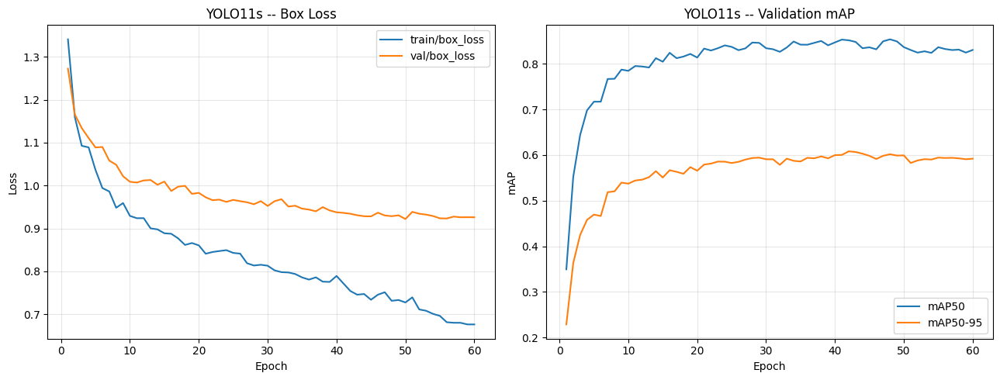

In [20]:
yolo_results_csv = '/content/runs/yolo11s/results.csv'
if os.path.exists(yolo_results_csv):
    yolo_hist = pd.read_csv(yolo_results_csv)
    yolo_hist.columns = [c.strip() for c in yolo_hist.columns]

    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    axes[0].plot(yolo_hist['epoch'], yolo_hist['train/box_loss'], label='train/box_loss')
    axes[0].plot(yolo_hist['epoch'], yolo_hist['val/box_loss'], label='val/box_loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
    axes[0].set_title('YOLO11s -- Box Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)

    axes[1].plot(yolo_hist['epoch'], yolo_hist['metrics/mAP50(B)'], label='mAP50')
    axes[1].plot(yolo_hist['epoch'], yolo_hist['metrics/mAP50-95(B)'], label='mAP50-95')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('mAP')
    axes[1].set_title('YOLO11s -- Validation mAP'); axes[1].legend(); axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig('/content/yolo11s_training_curves.png', dpi=150)
    plt.show()
else:
    print(f"{yolo_results_csv} not found -- run the training cell first.")

## 8. Evaluate YOLO11s

### 8a. Validation split

In [21]:
METRIC_COLS = ['model', 'mAP50', 'mAP50-95', 'precision', 'recall', 'f1']

def evaluate_yolo(model_path, model_name, data_yaml, split):
    """Run Ultralytics validation on one split ('val' or 'test'). Returns a dict of metrics and the output dir."""
    model = YOLO(model_path)
    results = model.val(data=data_yaml, split=split)
    p, r = results.box.mp, results.box.mr
    return {
        'model': model_name, 'split': split,
        'mAP50': results.box.map50, 'mAP50-95': results.box.map,
        'precision': p, 'recall': r, 'f1': 2 * p * r / (p + r + 1e-9),
        'save_dir': str(results.save_dir),
    }

yolo_val_metrics = evaluate_yolo(YOLO_WEIGHTS, 'YOLO11s', '/content/data.yaml', 'val')
comparison_df = pd.DataFrame([yolo_val_metrics])[METRIC_COLS]
comparison_df

Ultralytics 8.4.161 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,434,472 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3874.0±767.4 MB/s, size: 569.1 KB)
val: Scanning /content/data/validation/labels.cache... 264 images, 10 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 274/274 38.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 2.6it/s 7.0s
                   all        274       1705      0.885      0.785      0.853      0.609
                   Bag         47         48      0.909      0.832      0.935      0.656
                Basket         20         27      0.981      0.852       0.91      0.632
               Blanket         14         14      0.805      0.786      0.863      0.675
                  Book         57         79      0.976      0.873      0.922      0.602
                Bottle         81       

,model,mAP50,mAP50-95,precision,recall,f1
0,YOLO11s,0.852839,0.608625,0.88477,0.784686,0.831728


### 8b. Test split (final, evaluated once)

In [22]:
yolo_test_metrics = evaluate_yolo(YOLO_WEIGHTS, 'YOLO11s', '/content/data.yaml', 'test')
comparison_test_df = pd.DataFrame([yolo_test_metrics])
comparison_test_df

Ultralytics 8.4.161 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,434,472 parameters, 0 gradients, 21.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 640.7±1278.2 MB/s, size: 533.3 KB)
val: Scanning /content/data/test/labels... 262 images, 14 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 276/276 359.8it/s 0.8s
val: New cache created: /content/data/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 2.4it/s 7.5s
                   all        276       1830      0.845      0.801      0.849      0.619
                   Bag         60         66      0.933      0.839       0.93       0.62
                Basket         12         17      0.915      0.824      0.823      0.483
               Blanket          2          2      0.692          1      0.995       0.92
                  Book         59         85      0.915      0.759      0.847      0.

,model,split,mAP50,mAP50-95,precision,recall,f1,save_dir
0,YOLO11s,test,0.849481,0.61865,0.84495,0.801033,0.822405,/content/runs/detect/val-2


### 8c. Test metrics chart

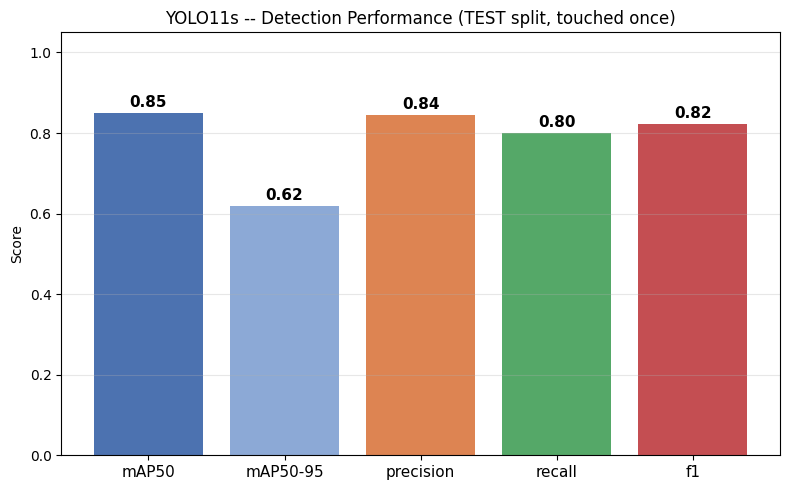

In [23]:
metric_cols = ['mAP50', 'mAP50-95', 'precision', 'recall', 'f1']
metrics_series = comparison_test_df.set_index('model')[metric_cols].iloc[0]

fig, ax = plt.subplots(figsize=(8, 5))
bar_colors = ['#4C72B0', '#8CA9D6', '#DD8452', '#55A868', '#C44E52']
bars = ax.bar(metrics_series.index, metrics_series.values, color=bar_colors)
plt.title('YOLO11s -- Detection Performance (TEST split, touched once)')
plt.ylabel('Score')
plt.xticks(rotation=0, fontsize=11)
plt.ylim(0, 1.05)
plt.grid(alpha=0.3, axis='y')
for b, v in zip(bars, metrics_series.values):
    ax.text(b.get_x() + b.get_width() / 2, v + 0.015, f'{v:.2f}', ha='center', fontweight='bold', fontsize=11)
plt.tight_layout()
plt.savefig('/content/model_comparison_test.png', dpi=150)
plt.show()

### 8d. Test confusion matrix and curves

YOLO11s -- TEST split (from /content/runs/detect/val-2):


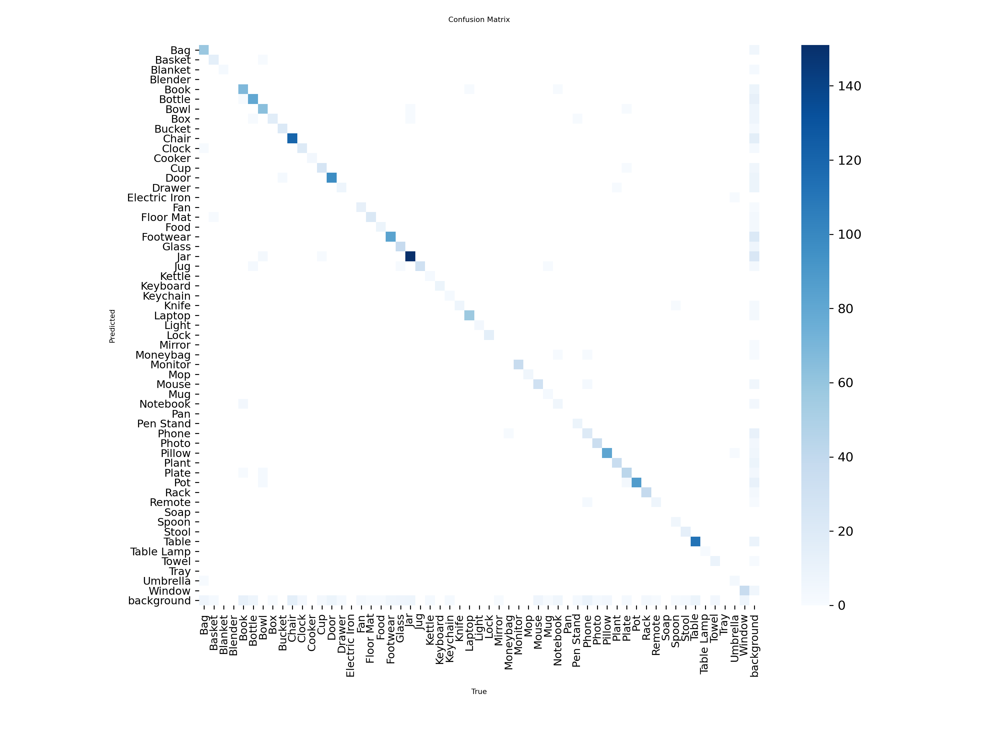

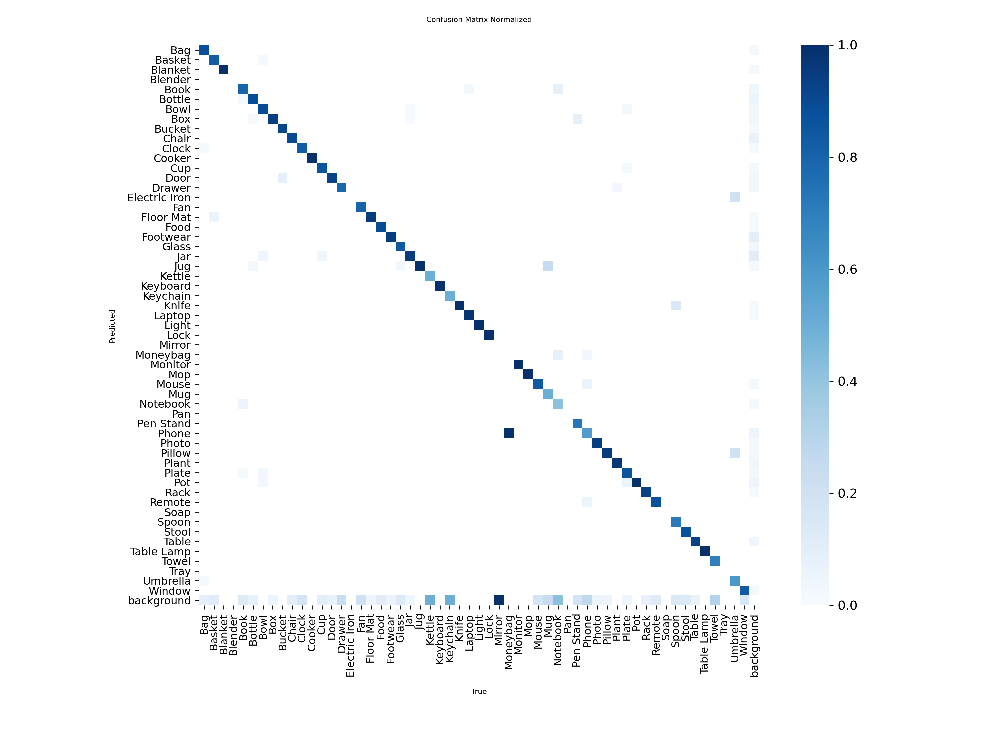

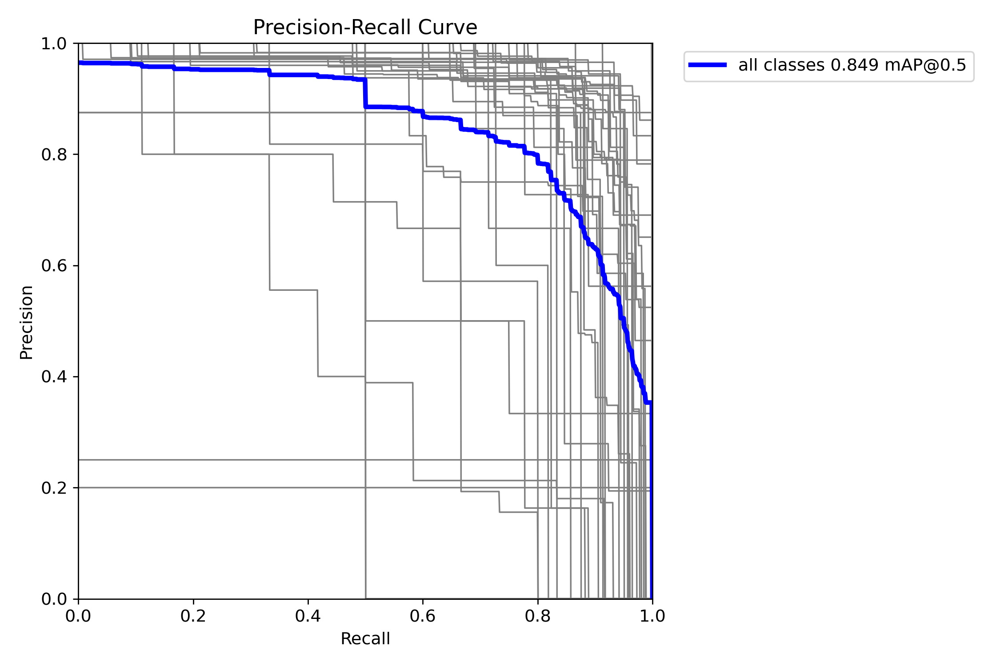

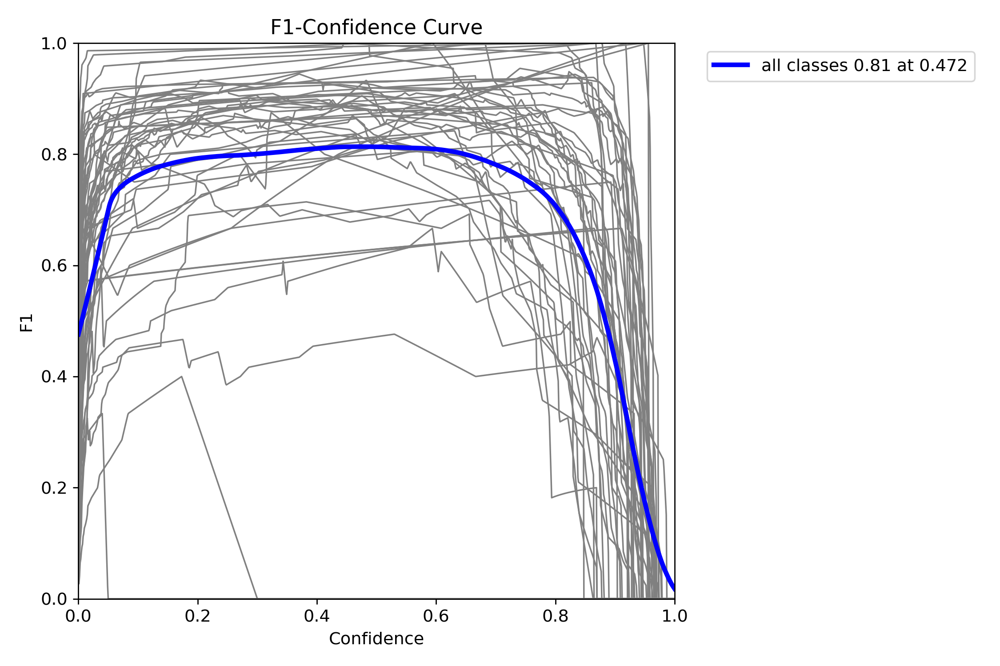

In [24]:
DET_PLOTS = ['confusion_matrix.png', 'confusion_matrix_normalized.png',
             'BoxPR_curve.png', 'PR_curve.png', 'BoxF1_curve.png', 'F1_curve.png']   # file names differ across Ultralytics versions

print(f"YOLO11s -- TEST split (from {yolo_test_metrics['save_dir']}):")
for fname in DET_PLOTS:
    fpath = os.path.join(yolo_test_metrics['save_dir'], fname)
    if os.path.exists(fpath):
        display(IPyImage(filename=fpath))

## 9. Detector Input / Output Gallery

Your single uploaded demo pair is reused in every gallery below: detector input → YOLO output → matching input/output → per-object change events → end-to-end pipeline trace.


### 9a. Input: raw reference / query pairs

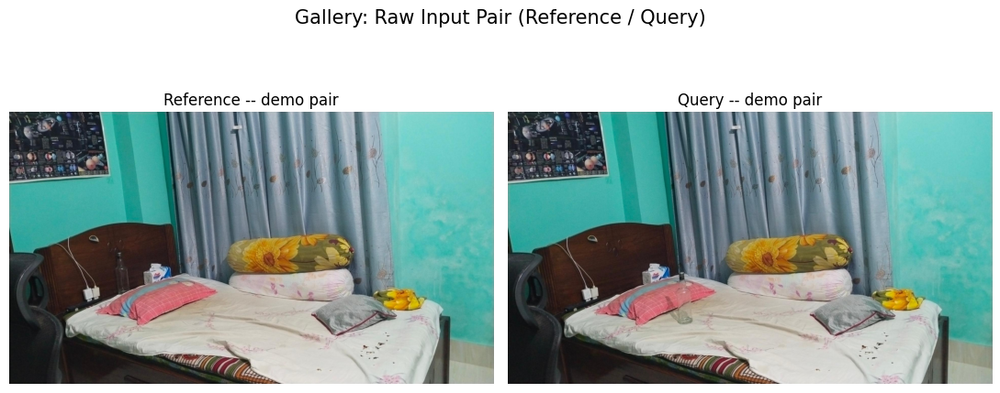

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))
axes[0].imshow(demo_reference_raw); axes[0].axis('off')
axes[0].set_title('Reference -- demo pair', fontsize=12)
axes[1].imshow(demo_query_raw); axes[1].axis('off')
axes[1].set_title('Query -- demo pair', fontsize=12)

plt.suptitle('Gallery: Raw Input Pair (Reference / Query)', fontsize=15, y=1.03)
plt.tight_layout()
plt.savefig('/content/gallery_1_raw_input.png', dpi=150, bbox_inches='tight')
plt.show()

### 9b. Output: YOLO detections (run on the CLAHE-preprocessed version of the same pairs)

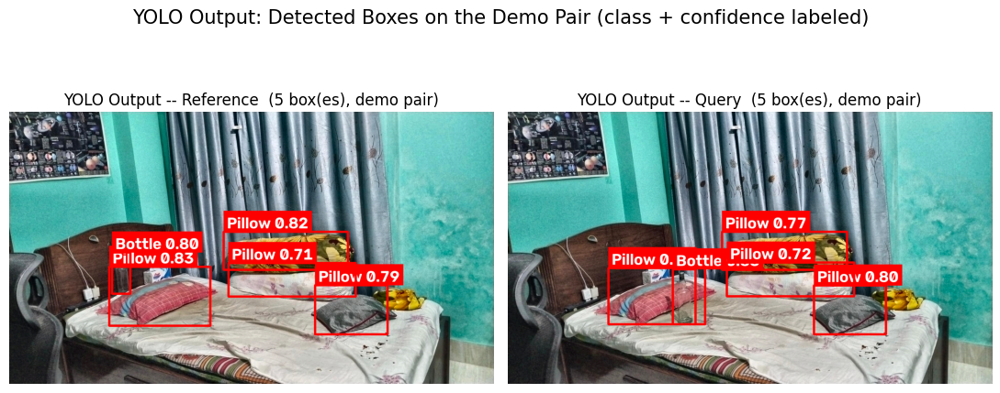

In [26]:
def draw_labeled_box(img, x1, y1, x2, y2, text, color, box_thickness=None):
    """Draw a bounding box plus a filled label chip behind the text, so the class
    name and confidence score stay clearly readable over any background. Box
    thickness, font size and padding all scale with the image resolution, so
    labels stay legible on both small crops and full-size phone-camera photos."""
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    h, w = img.shape[:2]
    scale = max(h, w) / 1000.0

    if box_thickness is None:
        box_thickness = max(4, round(scale * 4))
    cv2.rectangle(img, (x1, y1), (x2, y2), color, box_thickness)

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = max(0.9, scale * 1.1)
    font_thickness = max(2, round(scale * 2.4))
    (tw, th), baseline = cv2.getTextSize(text, font, font_scale, font_thickness)
    pad = max(7, round(scale * 7))
    label_y1 = y1 - th - 2 * pad if y1 - th - 2 * pad > 0 else y1  # flip below box if no room above
    label_y2 = label_y1 + th + 2 * pad
    label_x2 = min(x1 + tw + 2 * pad, w - 1)
    cv2.rectangle(img, (x1, label_y1), (label_x2, label_y2), color, -1)
    text_color = (255, 255, 255) if sum(color) < 400 else (0, 0, 0)
    cv2.putText(img, text, (x1 + pad, label_y2 - pad), font, font_scale, text_color,
                font_thickness, cv2.LINE_AA)

yolo_model = YOLO(YOLO_WEIGHTS)

def _yolo_annotate_img(img_bgr, model, conf=0.4):
    """Run YOLO on an in-memory BGR image (the CLAHE-preprocessed demo pair) and return an annotated RGB copy."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    result = model(img_bgr, conf=conf, verbose=False)[0]
    annotated = img_rgb.copy()
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        cls_name = model.names[int(box.cls[0])]
        conf_score = float(box.conf[0])
        draw_labeled_box(annotated, x1, y1, x2, y2, f'{cls_name} {conf_score:.2f}', (255, 0, 0))
    return annotated, len(result.boxes)

demo_reference_annot, demo_n_reference = _yolo_annotate_img(demo_reference_pre, yolo_model)
demo_query_annot,  demo_n_query  = _yolo_annotate_img(demo_query_pre,  yolo_model)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.6))
axes[0].imshow(demo_reference_annot); axes[0].axis('off')
axes[0].set_title(f"YOLO Output -- Reference  ({demo_n_reference} box(es), demo pair)", fontsize=12)
axes[1].imshow(demo_query_annot); axes[1].axis('off')
axes[1].set_title(f"YOLO Output -- Query  ({demo_n_query} box(es), demo pair)", fontsize=12)

plt.suptitle('YOLO Output: Detected Boxes on the Demo Pair (class + confidence labeled)',
             fontsize=15, y=1.03)
plt.tight_layout()
plt.savefig('/content/gallery_2_yolo_output.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Change-Detection Configuration & Functions

Order of use: camera-shift alignment → pixel-change map → box matching (Add/Delete/Move candidates) →
evidence scoring (pixel change, ghost check, move split/merge) → final decision (with low-confidence fallback).
All rules are hand-written; no classifier is trained anywhere in this stage.

In [27]:

CONF_THRESH         = 0.4     # a box needs this YOLO confidence to CREATE a change event
LOW_CONF_THRESH     = 0.10    # boxes between LOW_CONF_THRESH and CONF_THRESH are kept only as evidence
                              # (ghost check below, and the low-confidence fallback pass)
MOVE_MIN_THRESH     = 15.0    # minimum displacement (px) that counts as a Move
MOVE_SAFETY_FACTOR  = 3.0     # move threshold = max(MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR * camera-shift residual)
MOVE_REL_FRAC       = 0.20    # ...and the centre must also move more than this fraction of the box diagonal,
                              # so a 20px box-jitter on a 900px table is not reported as a Move
MAX_MATCH_DIST_FRAC = 0.35    # max centre distance for a match, as a fraction of the image diagonal
MIN_APPEARANCE_SIM  = 0.2     # min HSV-histogram correlation for two boxes to be the same object
W_DIST, W_IOU, W_APP = 0.55, 0.20, 0.25   # Hungarian cost weights (v40 used these but never defined them)

RECOVERY_APPEARANCE_SIM = 0.55   # 2nd-chance same-class match: if two leftover same-class boxes
                                  # (rejected by the strict distance cap above) look like the same
                                  # object, treat them as ONE Move instead of a Delete + Add pair.
CROSS_CLASS_SUPPRESS_IOU = 0.50  # if a leftover reference box and a leftover query box of a
                                  # DIFFERENT class overlap this much (post-alignment), it's almost
                                  # certainly the detector flipping its label on the same physical
                                  # object -- not a real Add+Delete -- so both are suppressed.
CHANGE_PROB_THRESHOLD = 0.60    # an event only counts as a genuine, final change if its
                                  # change-probability is >= this. Everything below is treated as
                                  # detector noise/jitter, not reported as a change.

CHANGE_MAP_WIDTH = 480     # the aligned reference/query pair is compared at this width
SSIM_FLOOR       = 0.10    # a pixel is "changed" only if its (1 - SSIM)/2 exceeds this ...
CHROMA_FLOOR     = 10.0    # ... or its a*b* colour difference (CIELAB units) exceeds this ...
PIXEL_CHANGE_K   = 3.0     # ... AND it is an outlier: robust z-score (median/MAD over the image) > K
VISUAL_SAT       = 0.35    # a box whose changed-pixel fraction reaches this gets the full visual score
MIN_BOX_CHANGE   = 0.10    # below this changed-pixel fraction a location counts as visually unchanged
GHOST_IOU        = 0.50    # a weak same-class box at the same spot in the other image means the object
                           # is still there (detector miss), so the Add/Delete is penalised ...
GHOST_PENALTY    = 0.80    # ... by this factor

DEFAULT_PARAMS = dict(
    conf_thresh=CONF_THRESH, low_conf_thresh=LOW_CONF_THRESH,
    move_min_thresh=MOVE_MIN_THRESH, move_safety_factor=MOVE_SAFETY_FACTOR, move_rel_frac=MOVE_REL_FRAC,
    max_match_dist_frac=MAX_MATCH_DIST_FRAC, min_appearance_sim=MIN_APPEARANCE_SIM,
    w_dist=W_DIST, w_iou=W_IOU, w_app=W_APP,
    recovery_sim=RECOVERY_APPEARANCE_SIM, cross_class_suppress_iou=CROSS_CLASS_SUPPRESS_IOU,
    prob_threshold=CHANGE_PROB_THRESHOLD,
    pixel_k=PIXEL_CHANGE_K, visual_sat=VISUAL_SAT, min_box_change=MIN_BOX_CHANGE,
    ghost_iou=GHOST_IOU, ghost_penalty=GHOST_PENALTY,
    alignment='ratio',     # 'ratio' = new ratio-test + sanity-checked homography, 'v40' = old alignment
    use_visual=True,       # score every event with pixel-change evidence
    use_ghost=True,        # veto Add/Delete when a weak detection shows the object is still there
    use_move_rules=True,   # split one-sided Moves into Add/Delete, merge same-class Add+Delete into a Move
    use_fallback=True,     # if nothing passes, re-run with the weak boxes (pixel evidence must carry it)
)


BASELINE_PARAMS = {**DEFAULT_PARAMS, 'alignment': 'v40', 'move_rel_frac': 0.0, 'use_visual': False, 'use_ghost': False,
                   'use_move_rules': False, 'use_fallback': False}

print(f"CONF_THRESH={CONF_THRESH}  LOW_CONF_THRESH={LOW_CONF_THRESH}  MOVE_MIN_THRESH={MOVE_MIN_THRESH}  "
      f"MAX_MATCH_DIST_FRAC={MAX_MATCH_DIST_FRAC}  RECOVERY_APPEARANCE_SIM={RECOVERY_APPEARANCE_SIM}  "
      f"CROSS_CLASS_SUPPRESS_IOU={CROSS_CLASS_SUPPRESS_IOU}  CHANGE_PROB_THRESHOLD={CHANGE_PROB_THRESHOLD}")
print(f"PIXEL_CHANGE_K={PIXEL_CHANGE_K}  VISUAL_SAT={VISUAL_SAT}  MIN_BOX_CHANGE={MIN_BOX_CHANGE}  "
      f"GHOST_IOU={GHOST_IOU}  MOVE_REL_FRAC={MOVE_REL_FRAC}")

CONF_THRESH=0.4  LOW_CONF_THRESH=0.1  MOVE_MIN_THRESH=15.0  MAX_MATCH_DIST_FRAC=0.35  RECOVERY_APPEARANCE_SIM=0.55  CROSS_CLASS_SUPPRESS_IOU=0.5  CHANGE_PROB_THRESHOLD=0.6
PIXEL_CHANGE_K=3.0  VISUAL_SAT=0.35  MIN_BOX_CHANGE=0.1  GHOST_IOU=0.5  MOVE_REL_FRAC=0.2


In [28]:
def _as_gray(img_or_path):
    if isinstance(img_or_path, str):
        return cv2.imread(img_or_path, cv2.IMREAD_GRAYSCALE)
    if img_or_path is None:
        return None
    return cv2.cvtColor(img_or_path, cv2.COLOR_BGR2GRAY) if img_or_path.ndim == 3 else img_or_path

def _homography_is_plausible(H, ref_shape, qry_shape, min_area_ratio=0.5, max_area_ratio=2.0):
    h, w = ref_shape[:2]
    corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
    warped = cv2.perspectiveTransform(corners, H).reshape(-1, 2).astype(np.float32)
    if not np.all(np.isfinite(warped)) or not cv2.isContourConvex(warped):
        return False
    area_ratio = cv2.contourArea(warped) / float(qry_shape[0] * qry_shape[1])
    return min_area_ratio <= area_ratio <= max_area_ratio

def estimate_camera_shift_v40(reference, query, max_features=2000, good_match_pct=0.2,
                              ransac_reproj_thresh=5.0):
    img1, img2 = _as_gray(reference), _as_gray(query)
    if img1 is None or img2 is None:
        return np.eye(3), 0.0
    orb = cv2.ORB_create(max_features)
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    if des1 is None or des2 is None or len(kp1) < 10 or len(kp2) < 10:
        return np.eye(3), 0.0
    matches = sorted(cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False).match(des1, des2),
                     key=lambda m: m.distance)
    matches = matches[:max(15, int(len(matches) * good_match_pct))]
    if len(matches) < 8:
        return np.eye(3), 0.0
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, inlier_mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=ransac_reproj_thresh)
    if H is None:
        return np.eye(3), 0.0
    inliers = inlier_mask.ravel().astype(bool)
    if inliers.sum() < 8:
        return np.eye(3), 0.0
    pts1_proj = cv2.perspectiveTransform(pts1[inliers], H)
    return H, float(np.median(np.linalg.norm((pts1_proj - pts2[inliers]).reshape(-1, 2), axis=1)))

def estimate_camera_shift(reference, query, max_features=4000, ratio=0.75, ransac_reproj_thresh=5.0):
    img1, img2 = _as_gray(reference), _as_gray(query)
    if img1 is None or img2 is None:
        return np.eye(3), 0.0

    orb = cv2.ORB_create(max_features)
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)
    if des1 is None or des2 is None or len(kp1) < 10 or len(kp2) < 10:
        return np.eye(3), 0.0

    knn = cv2.BFMatcher(cv2.NORM_HAMMING).knnMatch(des1, des2, k=2)
    matches = [p[0] for p in knn if len(p) == 2 and p[0].distance < ratio * p[1].distance]
    if len(matches) < 12:
        return np.eye(3), 0.0

    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H, inlier_mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransacReprojThreshold=ransac_reproj_thresh)
    if H is None:
        return np.eye(3), 0.0

    inliers = inlier_mask.ravel().astype(bool)
    if inliers.sum() < 8 or not _homography_is_plausible(H, img1.shape, img2.shape):
        return np.eye(3), 0.0

    pts1_proj = cv2.perspectiveTransform(pts1[inliers], H)
    residuals = np.linalg.norm((pts1_proj - pts2[inliers]).reshape(-1, 2), axis=1)
    residual_px = float(np.median(residuals))

    return H, residual_px

def adaptive_move_thresh(residual_px, min_thresh=15.0, safety_factor=3.0):
    return max(min_thresh, safety_factor * residual_px)

### 10b. Pixel-level change map

The reference image is warped into the query frame with `H`, both are downscaled to 480 px wide, and each pixel gets
a dissimilarity from **SSIM** (structure, insensitive to exposure changes) and **a\*b\* chroma distance** (colour,
insensitive to lightness/shadows). Each dissimilarity is turned into a robust z-score using the median and MAD of the
whole image: most of an indoor scene is unchanged, so these statistics model noise + lighting drift, and real object
changes stand out as outliers. `box_change_fraction` then reports what fraction of a box's pixels changed.

In [29]:
def _ssim_map(g1, g2, sigma=1.5):

    C1, C2 = (0.01 * 255) ** 2, (0.03 * 255) ** 2
    g1, g2 = g1.astype(np.float32), g2.astype(np.float32)
    blur = lambda x: cv2.GaussianBlur(x, (0, 0), sigma)
    mu1, mu2 = blur(g1), blur(g2)
    s11 = blur(g1 * g1) - mu1 * mu1
    s22 = blur(g2 * g2) - mu2 * mu2
    s12 = blur(g1 * g2) - mu1 * mu2
    return ((2 * mu1 * mu2 + C1) * (2 * s12 + C2)) / ((mu1 ** 2 + mu2 ** 2 + C1) * (s11 + s22 + C2))

def _robust_z(x, valid):

    v = x[valid]
    if v.size == 0:
        return np.zeros_like(x)
    med = float(np.median(v))
    mad = float(np.median(np.abs(v - med))) * 1.4826
    return (x - med) / max(mad, 1e-3)

def compute_change_map(reference_bgr, query_bgr, H, work_width=CHANGE_MAP_WIDTH,
                        ssim_floor=SSIM_FLOOR, chroma_floor=CHROMA_FLOOR):

    if reference_bgr is None or query_bgr is None:
        return None
    hq, wq = query_bgr.shape[:2]
    scale = work_width / float(wq)
    size = (work_width, max(1, int(round(hq * scale))))
    s_ref = work_width / float(reference_bgr.shape[1])

    qry_small = cv2.resize(query_bgr, size, interpolation=cv2.INTER_AREA)
    ref_small = cv2.resize(reference_bgr, None, fx=s_ref, fy=s_ref, interpolation=cv2.INTER_AREA)
    H = np.eye(3) if H is None else H
    Hs = np.diag([scale, scale, 1.0]) @ H @ np.diag([1.0 / s_ref, 1.0 / s_ref, 1.0])
    ref_warp = cv2.warpPerspective(ref_small, Hs, size, flags=cv2.INTER_LINEAR)
    valid = cv2.warpPerspective(np.full(ref_small.shape[:2], 255, np.uint8), Hs, size,
                                flags=cv2.INTER_NEAREST)
    valid = cv2.erode(valid, np.ones((7, 7), np.uint8)) > 0

    ref_warp = cv2.GaussianBlur(ref_warp, (0, 0), 1.0)
    qry_small = cv2.GaussianBlur(qry_small, (0, 0), 1.0)


    d_struct = (1.0 - _ssim_map(cv2.cvtColor(ref_warp, cv2.COLOR_BGR2GRAY),
                                cv2.cvtColor(qry_small, cv2.COLOR_BGR2GRAY))) / 2.0

    lab1 = cv2.cvtColor(ref_warp, cv2.COLOR_BGR2LAB).astype(np.float32)
    lab2 = cv2.cvtColor(qry_small, cv2.COLOR_BGR2LAB).astype(np.float32)
    d_chroma = np.sqrt((lab1[..., 1] - lab2[..., 1]) ** 2 + (lab1[..., 2] - lab2[..., 2]) ** 2)
    d_chroma = cv2.GaussianBlur(d_chroma, (0, 0), 2.0)

    z_struct = np.where(d_struct > ssim_floor, _robust_z(d_struct, valid), 0.0)
    z_chroma = np.where(d_chroma > chroma_floor, _robust_z(d_chroma, valid), 0.0)
    score = np.maximum(z_struct, z_chroma)
    score[~valid] = 0.0
    return {'score': np.clip(score, 0, 60000).astype(np.float16), 'scale': scale}

def box_change_fraction(change, bbox_query_frame, pixel_k):

    if change is None:
        return None
    sc, s = change['score'], change['scale']
    h, w = sc.shape
    x1, y1, x2, y2 = bbox_query_frame
    x1, y1 = max(0, int(np.floor(x1 * s))), max(0, int(np.floor(y1 * s)))
    x2, y2 = min(w, int(np.ceil(x2 * s))), min(h, int(np.ceil(y2 * s)))
    if x2 <= x1 or y2 <= y1:
        return 0.0
    return float((sc[y1:y2, x1:x2] > pixel_k).mean())

def changed_mask(change, pixel_k):
    return None if change is None else (change['score'] > pixel_k)

In [30]:
def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x3, y3, x4, y4 = box2
    xi1, yi1 = max(x1, x3), max(y1, y3)
    xi2, yi2 = min(x2, x4), min(y2, y4)
    inter = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (x4 - x3) * (y4 - y3)
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0.0

def extract_boxes(results, model):
    boxes = []
    if results[0].boxes is not None:
        for box in results[0].boxes:
            xyxy = box.xyxy[0].cpu().numpy().tolist()
            cls_id = int(box.cls[0].cpu().numpy())
            boxes.append({
                'class': model.names[cls_id],
                'bbox': xyxy,
                'confidence': float(box.conf[0].cpu().numpy())
            })
    return boxes

def normalize_name(s):
    return s.replace('-', ' ').replace('_', ' ').strip().lower()

def warp_bbox(bbox, H):
    if H is None:
        return bbox
    x1, y1, x2, y2 = bbox
    corners = np.array([[[x1, y1]], [[x2, y1]], [[x2, y2]], [[x1, y2]]], dtype=np.float32)
    warped = cv2.perspectiveTransform(corners, H).reshape(-1, 2)
    wx1, wy1 = float(warped[:, 0].min()), float(warped[:, 1].min())
    wx2, wy2 = float(warped[:, 0].max()), float(warped[:, 1].max())
    return [wx1, wy1, wx2, wy2]

def get_image_size(path):
    with PILImage.open(path) as im:
        return im.size

def crop_bbox(img, bbox, pad=4):
    if img is None:
        return None
    h, w = img.shape[:2]
    x1, y1, x2, y2 = [int(round(v)) for v in bbox]
    x1, y1 = max(0, x1 - pad), max(0, y1 - pad)
    x2, y2 = min(w, x2 + pad), min(h, y2 + pad)
    if x2 <= x1 or y2 <= y1:
        return None
    return img[y1:y2, x1:x2]

def box_histogram(img_bgr, bbox, pad=4):
    crop = crop_bbox(img_bgr, bbox, pad)
    if crop is None or crop.size == 0:
        return None
    hsv = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)
    hist = cv2.calcHist([hsv], [0, 1], None, [50, 60], [0, 180, 0, 256])
    cv2.normalize(hist, hist)
    return hist

def attach_histograms(boxes, img_bgr):
    for b in boxes:
        b['hist'] = box_histogram(img_bgr, b['bbox'])
    return boxes

def appearance_similarity(box_a, box_b):
    if 'hist' not in box_a or 'hist' not in box_b:
        return 1.0
    if box_a['hist'] is None or box_b['hist'] is None:
        return 0.0
    return float(max(0.0, cv2.compareHist(box_a['hist'], box_b['hist'], cv2.HISTCMP_CORREL)))

def split_by_conf(boxes, conf_thresh, low_conf_thresh=0.0):
    strong = [b for b in boxes if b['confidence'] >= conf_thresh]
    weak = [b for b in boxes if low_conf_thresh <= b['confidence'] < conf_thresh]
    return strong, weak


def _clip01(x):
    return float(min(1.0, max(0.0, x)))

def _center(bbox):
    return (bbox[0] + bbox[2]) / 2.0, (bbox[1] + bbox[3]) / 2.0

def _diag(bbox):
    return float(np.hypot(bbox[2] - bbox[0], bbox[3] - bbox[1]))

def move_probability(dist, move_thresh, sim, conf_b, conf_a, visual=None, saturation_ratio=2.5):
    ratio = dist / max(move_thresh, 1e-6)
    dist_term = _clip01((ratio - 1.0) / max(saturation_ratio - 1.0, 1e-6))
    sim_term = _clip01(sim)
    conf_term = _clip01((conf_b + conf_a) / 2.0)
    if visual is None:
        p = 0.55 * dist_term + 0.30 * sim_term + 0.15 * conf_term
    else:
        p = 0.35 * dist_term + 0.15 * sim_term + 0.15 * conf_term + 0.35 * _clip01(visual)
    return _clip01(p)

def add_delete_probability(conf, cross_class_iou=0.0, visual=None, ghost=False, ghost_penalty=0.8):
    base = _clip01(conf)
    if visual is not None:
        base = 0.45 * base + 0.55 * _clip01(visual)
    p = base * (1.0 - 0.85 * _clip01(cross_class_iou))
    if ghost:
        p *= (1.0 - ghost_penalty)
    return _clip01(p)


def match_boxes(reference_boxes, query_boxes, H=None, move_thresh=50, image_diag=None, params=None,
                change=None, ref_weak=(), qry_weak=()):
    P = {**DEFAULT_PARAMS, **(params or {})}
    events, matched_pairs, suppressed = [], [], []
    max_match_dist = (P['max_match_dist_frac'] * image_diag) if image_diag else float('inf')
    use_visual = bool(P['use_visual']) and change is not None
    move_rules = use_visual and bool(P['use_move_rules'])
    use_appearance = all('hist' in b for b in list(reference_boxes) + list(query_boxes))

    ref_warped = [warp_bbox(b['bbox'], H) for b in reference_boxes]
    ref_weak_warped = [warp_bbox(b['bbox'], H) for b in ref_weak]

    # changed-pixel fraction at every box location (reference boxes are looked up at their warped position)
    ref_frac = [box_change_fraction(change, rw, P['pixel_k']) for rw in ref_warped] if use_visual \
        else [None] * len(reference_boxes)
    qry_frac = [box_change_fraction(change, a['bbox'], P['pixel_k']) for a in query_boxes] if use_visual \
        else [None] * len(query_boxes)

    def vis(frac):
        return None if frac is None else _clip01(frac / max(P['visual_sat'], 1e-6))

    def changed(frac):
        return frac is not None and frac >= P['min_box_change']

    def ghost_for_ref(i):
        cls = reference_boxes[i]['class']
        return any(w['class'] == cls and compute_iou(ref_warped[i], w['bbox']) >= P['ghost_iou']
                   for w in qry_weak)

    def ghost_for_qry(j):
        cls = query_boxes[j]['class']
        return any(w['class'] == cls and compute_iou(query_boxes[j]['bbox'], ww) >= P['ghost_iou']
                   for w, ww in zip(ref_weak, ref_weak_warped))

    def move_thresh_for(i, j):
        rel = P['move_rel_frac'] * 0.5 * (_diag(ref_warped[i]) + _diag(query_boxes[j]['bbox']))
        return max(move_thresh, rel)

    def delete_event(i, note=None):
        b = reference_boxes[i]
        ghost = bool(P['use_ghost']) and ghost_for_ref(i)
        cross_iou = max((compute_iou(ref_warped[i], query_boxes[j]['bbox'])
                         for j in unmatched_qry if query_boxes[j]['class'] != b['class']), default=0.0)
        e = {'type': 'Delete', 'object': b['class'], 'confidence': b['confidence'], 'movement': 0.0,
             'probability': add_delete_probability(b['confidence'], cross_iou, vis(ref_frac[i]),
                                                   ghost, P['ghost_penalty']),
             'visual_change': ref_frac[i], 'ghost': ghost, 'bbox_ref': b['bbox']}
        if note:
            e['note'] = note
        return e

    def add_event(j, note=None):
        a = query_boxes[j]
        ghost = bool(P['use_ghost']) and ghost_for_qry(j)
        cross_iou = max((compute_iou(ref_warped[i], a['bbox'])
                         for i in unmatched_ref if reference_boxes[i]['class'] != a['class']), default=0.0)
        e = {'type': 'Add', 'object': a['class'], 'confidence': a['confidence'], 'movement': 0.0,
             'probability': add_delete_probability(a['confidence'], cross_iou, vis(qry_frac[j]),
                                                   ghost, P['ghost_penalty']),
             'visual_change': qry_frac[j], 'ghost': ghost, 'bbox_qry': a['bbox']}
        if note:
            e['note'] = note
        return e

    def emit_match(i, j, dist, sim, note=None):
        b, a = reference_boxes[i], query_boxes[j]
        mt = move_thresh_for(i, j)
        role = 'unchanged'
        if dist > mt:
            role = 'Move'
            if move_rules:
                src, dst = changed(ref_frac[i]), changed(qry_frac[j])
                if src and not dst:
                    role = 'Delete'
                elif dst and not src:
                    role = 'Add'
                elif not src and not dst:
                    role = 'unchanged'
        if role == 'Move':
            v = 0.5 * (vis(ref_frac[i]) + vis(qry_frac[j])) if use_visual else None
            e = {'type': 'Move', 'object': b['class'],
                 'confidence': (b['confidence'] + a['confidence']) / 2, 'movement': dist,
                 'appearance_sim': sim,
                 'probability': move_probability(dist, mt, sim, b['confidence'], a['confidence'], v),
                 'visual_change': None if v is None else 0.5 * (ref_frac[i] + qry_frac[j]),
                 'bbox_ref': b['bbox'], 'bbox_qry': a['bbox']}
            if note:
                e['note'] = note
            events.append(e)
        elif role == 'Delete':
            events.append(delete_event(i, 'one-sided move: only the source location changed'))
        elif role == 'Add':
            events.append(add_event(j, 'one-sided move: only the destination location changed'))
        matched_pairs.append((b, a, dist, sim, role))

    classes = set(b['class'] for b in reference_boxes) | set(a['class'] for a in query_boxes)
    unmatched_ref = set(range(len(reference_boxes)))
    unmatched_qry = set(range(len(query_boxes)))


    for cls in classes:
        b_idx = [i for i, b in enumerate(reference_boxes) if b['class'] == cls]
        a_idx = [j for j, a in enumerate(query_boxes) if a['class'] == cls]
        if not b_idx or not a_idx:
            continue

        cost = np.zeros((len(b_idx), len(a_idx)))
        dist_cache = np.zeros_like(cost)
        iou_cache = np.zeros_like(cost)
        sim_cache = np.ones_like(cost)
        for bi, i in enumerate(b_idx):
            bx, by = _center(ref_warped[i])
            for aj, j in enumerate(a_idx):
                ax, ay = _center(query_boxes[j]['bbox'])
                dist = float(np.hypot(ax - bx, ay - by))
                dist_frac = min(dist / image_diag, 1.0) if image_diag else min(dist / 1000.0, 1.0)
                iou = compute_iou(ref_warped[i], query_boxes[j]['bbox'])
                sim = appearance_similarity(reference_boxes[i], query_boxes[j])
                dist_cache[bi, aj], iou_cache[bi, aj], sim_cache[bi, aj] = dist, iou, sim
                cost[bi, aj] = P['w_dist'] * dist_frac + P['w_iou'] * (1.0 - iou) + P['w_app'] * (1.0 - sim)

        row_ind, col_ind = linear_sum_assignment(cost)
        for bi, aj in zip(row_ind, col_ind):
            dist, sim, iou = float(dist_cache[bi, aj]), float(sim_cache[bi, aj]), float(iou_cache[bi, aj])
            if dist > max_match_dist:
                continue
            if sim < P['min_appearance_sim'] and iou < 0.15:
                continue
            i, j = b_idx[bi], a_idx[aj]
            unmatched_ref.discard(i)
            unmatched_qry.discard(j)
            emit_match(i, j, dist, sim)


    for cls in classes:
        b_left = sorted(i for i in unmatched_ref if reference_boxes[i]['class'] == cls)
        a_left = sorted(j for j in unmatched_qry if query_boxes[j]['class'] == cls)
        if not b_left or not a_left:
            continue
        scored = sorted(((appearance_similarity(reference_boxes[i], query_boxes[j]), i, j)
                         for i in b_left for j in a_left), key=lambda t: -t[0])
        for sim, i, j in scored:
            if i not in unmatched_ref or j not in unmatched_qry:
                continue
            recovered = use_appearance and sim >= P['recovery_sim']
            merged = (move_rules and changed(ref_frac[i]) and changed(qry_frac[j])
                      and not (P['use_ghost'] and (ghost_for_ref(i) or ghost_for_qry(j))))
            if not (recovered or merged):
                continue
            bx, by = _center(ref_warped[i])
            ax, ay = _center(query_boxes[j]['bbox'])
            dist = float(np.hypot(ax - bx, ay - by))
            unmatched_ref.discard(i)
            unmatched_qry.discard(j)
            emit_match(i, j, dist, sim,
                       note='recovered match (same object relocated beyond the strict search radius)'
                       if recovered else
                       'merged: same-class object vanished at one spot and appeared at another')


    cross_suppressed_ref, cross_suppressed_qry = set(), set()
    for i in sorted(unmatched_ref):
        best_iou, best_j = 0.0, None
        for j in unmatched_qry:
            if j in cross_suppressed_qry or query_boxes[j]['class'] == reference_boxes[i]['class']:
                continue
            iou = compute_iou(ref_warped[i], query_boxes[j]['bbox'])
            if iou > best_iou:
                best_iou, best_j = iou, j
        if best_j is not None and best_iou >= P['cross_class_suppress_iou']:
            cross_suppressed_ref.add(i)
            cross_suppressed_qry.add(best_j)
            suppressed.append({'ref_class': reference_boxes[i]['class'], 'qry_class': query_boxes[best_j]['class'],
                               'iou': round(best_iou, 3),
                               'note': 'cross-class overlap -- likely a detector class-flip on the same object, not a real change'})


    for i in sorted(unmatched_ref - cross_suppressed_ref):
        events.append(delete_event(i))
    for j in sorted(unmatched_qry - cross_suppressed_qry):
        events.append(add_event(j))

    return events, matched_pairs, suppressed


def decide_final_changes(events, prob_threshold=CHANGE_PROB_THRESHOLD):

    scored = [e for e in events if e['type'] in ('Add', 'Delete', 'Move')]
    changes = sorted((e for e in scored if e['probability'] >= prob_threshold),
                      key=lambda e: -e['probability'])
    rejected = sorted((e for e in scored if e['probability'] < prob_threshold),
                       key=lambda e: -e['probability'])

    if not changes:
        if rejected:
            top = rejected[0]
            summary = (f"No significant change detected -- closest candidate was '{top['object']}' "
                       f"({top['type']}) at {top['probability']*100:.0f}%, below the "
                       f"{prob_threshold*100:.0f}% decision threshold.")
        else:
            summary = "No significant change detected -- scene unchanged."
        return {'has_change': False, 'changes': [], 'rejected': rejected, 'summary': summary}

    parts = [f"'{e['object']}' -- {e['type']} ({e['probability']*100:.0f}%)" for e in changes]
    n = len(changes)
    summary = (f"{n} object change{'s' if n != 1 else ''} detected: " + "; ".join(parts))
    return {'has_change': True, 'changes': changes, 'rejected': rejected, 'summary': summary}


def detect_changes(c, params=None):
    P = {**DEFAULT_PARAMS, **(params or {})}
    H, residual = (c['H'], c['residual_px']) if P['alignment'] == 'ratio' else (c['H_v40'], c['residual_px_v40'])
    move_thresh = adaptive_move_thresh(residual, P['move_min_thresh'], P['move_safety_factor'])
    strong_r, weak_r = split_by_conf(c['reference_boxes'], P['conf_thresh'], P['low_conf_thresh'])
    strong_q, weak_q = split_by_conf(c['query_boxes'], P['conf_thresh'], P['low_conf_thresh'])
    change = c.get('change') if P['use_visual'] else None
    common = dict(H=H, move_thresh=move_thresh, image_diag=c['image_diag'], params=P, change=change)

    events, matched, suppressed = match_boxes(strong_r, strong_q, ref_weak=weak_r, qry_weak=weak_q, **common)
    decision = decide_final_changes(events, P['prob_threshold'])
    used_pass = 'strict'
    if not decision['has_change'] and P['use_fallback'] and change is not None and (weak_r or weak_q):
        ev2, m2, s2 = match_boxes(strong_r + weak_r, strong_q + weak_q, **common)
        d2 = decide_final_changes(ev2, P['prob_threshold'])
        if d2['has_change']:
            events, matched, suppressed, decision = ev2, m2, s2, d2
            used_pass = 'fallback (low-confidence boxes)'
    return {'events': events, 'matched_pairs': matched, 'suppressed': suppressed, 'decision': decision,
            'move_thresh': move_thresh, 'H': H, 'residual_px': residual, 'pass': used_pass, 'change': change,
            'reference_boxes': strong_r, 'query_boxes': strong_q}


def summarize_events(events, matched_pairs=None):
    matched_pairs = matched_pairs or []
    add_events = [e for e in events if e['type'] == 'Add']
    del_events = [e for e in events if e['type'] == 'Delete']
    move_events = [e for e in events if e['type'] == 'Move']

    def best(evs):
        return max(evs, key=lambda e: e['probability']) if evs else None

    best_add, best_del, best_move = best(add_events), best(del_events), best(move_events)
    max_matched_dist = max((m[2] for m in matched_pairs), default=0.0)
    avg_appearance_sim = float(np.mean([m[3] for m in matched_pairs])) if matched_pairs else 0.0

    return {
        'n_add': len(add_events), 'n_del': len(del_events), 'n_move': len(move_events),
        'net': len(add_events) - len(del_events),
        'best_add_conf': best_add['confidence'] if best_add else 0.0,
        'best_del_conf': best_del['confidence'] if best_del else 0.0,
        'best_move_conf': best_move['confidence'] if best_move else 0.0,
        'best_move_dist': best_move['movement'] if best_move else 0.0,
        'max_matched_dist': max_matched_dist,
        'avg_appearance_sim': avg_appearance_sim,
        'best_add': best_add, 'best_del': best_del, 'best_move': best_move,
    }


def primary_event(events):
    decision = decide_final_changes(events)
    return decision['changes'][0] if decision['has_change'] else None


def build_events_df(cache, params=None):
    P = {**DEFAULT_PARAMS, **(params or {})}
    event_rows, summary_rows, contexts = [], [], []
    for c in cache:
        r = detect_changes(c, P)
        events, decision = r['events'], r['decision']
        final_ids = {id(e) for e in decision['changes']}

        for e in events:
            event_rows.append({
                'pair_id': c['pair_id'], 'object': e['object'], 'change_type': e['type'],
                'confidence': round(e['confidence'], 3), 'movement_px': round(e['movement'], 1),
                'visual_change': None if e.get('visual_change') is None else round(e['visual_change'], 3),
                'probability': round(e['probability'], 3), 'is_final_change': id(e) in final_ids,
                'split': c['split'],
            })

        stats = summarize_events(events, r['matched_pairs'])
        pe = decision['changes'][0] if decision['has_change'] else None
        summary_rows.append({
            'pair_id': c['pair_id'],
            'true_change': c['true_change'], 'true_object': c['true_object'], 'room': c['room'],
            'split': c['split'],
            'predicted_change': pe['type'] if pe else 'None',
            'predicted_object': pe['object'] if pe else 'None',
            'predicted_change_prob': round(pe['probability'], 3) if pe else 0.0,
            'n_events': len(events), 'n_final_changes': len(decision['changes']),
            'n_suppressed_cross_class': len(r['suppressed']),
            'decision_pass': r['pass'],
            'move_thresh_used': r['move_thresh'],
            'camera_shift_residual_px': r['residual_px'],
        })
        contexts.append({'stats': stats, 'matched_pairs': r['matched_pairs'], 'events': events,
                         'suppressed': r['suppressed'], 'decision': decision, 'pass': r['pass']})
    return pd.DataFrame(event_rows), pd.DataFrame(summary_rows), contexts


CHANGE_LABELS = ['Add', 'Delete', 'Move']

def pair_metrics(summary_df):
    """Pair-level scores. A 'None' prediction counts as WRONG (every pair in this dataset has a change)."""
    y, p = summary_df['true_change'], summary_df['predicted_change']
    f1s = []
    for c in CHANGE_LABELS:
        tp = int(((y == c) & (p == c)).sum())
        fp = int(((y != c) & (p == c)).sum())
        fn = int(((y == c) & (p != c)).sum())
        f1s.append(2 * tp / max(2 * tp + fp + fn, 1))
    obj_ok = summary_df['predicted_object'].map(normalize_name) == summary_df['true_object'].map(normalize_name)
    return {'n_pairs': len(summary_df),
            'accuracy': float((y == p).mean()),
            'macro_f1': float(np.mean(f1s)),
            'coverage': float((p != 'None').mean()),
            'type_and_object_acc': float(((y == p) & obj_ok).mean())}

## 11. Detect Objects, Align, Build Pixel-Change Maps

### 11a. One pass over all pairs (YOLO at conf 0.10, both alignments, change map, appearance histograms)

In [31]:
CHANGE_LABEL_MAP = {'add': 'Add', 'delete': 'Delete', 'move': 'Move'}

pairs_df = ALL_PAIRS_DF.copy()
pairs_df['true_change'] = pairs_df['change_type'].map(CHANGE_LABEL_MAP)
assert pairs_df['true_change'].notna().all(), "Unexpected change_type in ALL_PAIRS_DF"
pairs_df = pairs_df.rename(columns={'object': 'true_object'})

print(f"{len(pairs_df)} labeled reference/query pairs")
pairs_df[['pair_id', 'reference_path', 'query_path', 'true_change', 'true_object', 'room', 'split']].head()

915 labeled reference/query pairs


,pair_id,reference_path,query_path,true_change,true_object,room,split
0,0059,/content/custom_data/images/2107038_2c97fbb7-0...,/content/custom_data/images/2107038_c52b77ff-0...,Add,bag,bedroom,train
1,0060,/content/custom_data/images/2107038_be1debbe-0...,/content/custom_data/images/2107038_ae547178-0...,Move,bag,bedroom,validation
2,0061,/content/custom_data/images/2107038_438a97d3-0...,/content/custom_data/images/2107038_aa8dcf7e-0...,Delete,bag,bedroom,validation
3,0062,/content/custom_data/images/2107038_15b92529-0...,/content/custom_data/images/2107038_942d0f68-0...,Add,chair,bedroom,validation
4,0063,/content/custom_data/images/2107038_70e45993-0...,/content/custom_data/images/2107038_34b3a240-0...,Move,chair,bedroom,train


In [32]:
def raw_version(path):
    p = os.path.join(ORIG_BACKUP_DIR, os.path.basename(path))
    return p if os.path.exists(p) else path

def prepare_pair(reference_boxes, query_boxes, ref_pre, qry_pre, ref_raw, qry_raw):
    attach_histograms(reference_boxes, ref_pre)
    attach_histograms(query_boxes, qry_pre)
    H, residual_px = estimate_camera_shift(ref_pre, qry_pre)
    H_v40, residual_px_v40 = estimate_camera_shift_v40(ref_pre, qry_pre)
    qh, qw = qry_pre.shape[:2]
    return {'reference_boxes': reference_boxes, 'query_boxes': query_boxes,
            'H': H, 'residual_px': residual_px, 'H_v40': H_v40, 'residual_px_v40': residual_px_v40,
            'image_diag': float(np.hypot(qw, qh)),
            'change': compute_change_map(ref_raw, qry_raw, H)}

detection_cache = []
BATCH_SIZE = 16
pair_rows = pairs_df.to_dict('records')

for batch_start in range(0, len(pair_rows), BATCH_SIZE):
    batch = pair_rows[batch_start: batch_start + BATCH_SIZE]
    batch_paths = [p for row in batch for p in (row['reference_path'], row['query_path'])]
    batch_results = yolo_model(batch_paths, conf=LOW_CONF_THRESH, verbose=False)

    for k, row in enumerate(batch):
        entry = prepare_pair(
            extract_boxes([batch_results[2 * k]], yolo_model), extract_boxes([batch_results[2 * k + 1]], yolo_model),
            cv2.imread(row['reference_path']), cv2.imread(row['query_path']),
            cv2.imread(raw_version(row['reference_path'])), cv2.imread(raw_version(row['query_path'])))
        entry.update({
            'pair_id': row['pair_id'], 'reference_path': row['reference_path'], 'query_path': row['query_path'],
            'true_change': row['true_change'], 'true_object': row['true_object'], 'room': row['room'],
            'split': row['split'],
        })
        detection_cache.append(entry)
    if (batch_start // BATCH_SIZE) % 10 == 0:
        print(f"  processed {min(batch_start + BATCH_SIZE, len(pair_rows))}/{len(pair_rows)} pairs")

n_strong = sum(b['confidence'] >= CONF_THRESH for c in detection_cache for b in c['reference_boxes'] + c['query_boxes'])
n_all = sum(len(c['reference_boxes']) + len(c['query_boxes']) for c in detection_cache)
n_fallback_H = sum(np.allclose(c['H'], np.eye(3)) and c['residual_px'] == 0.0 for c in detection_cache)
print(f"Detections, alignment and pixel-change maps ready for {len(detection_cache)} pairs: "
      f"{n_strong} confident boxes (>= {CONF_THRESH}) + {n_all - n_strong} weak evidence boxes "
      f"(>= {LOW_CONF_THRESH}); {n_fallback_H} pairs fell back to identity alignment.")


demo_entry = prepare_pair(
    extract_boxes(yolo_model(demo_reference_pre, conf=LOW_CONF_THRESH, verbose=False), yolo_model),
    extract_boxes(yolo_model(demo_query_pre, conf=LOW_CONF_THRESH, verbose=False), yolo_model),
    demo_reference_pre, demo_query_pre, demo_reference_bgr, demo_query_bgr)
demo_entry.update({'pair_id': 'demo', 'reference_path': USER_REFERENCE_PATH, 'query_path': USER_QUERY_PATH,
                   'true_change': None, 'true_object': None, 'room': None, 'split': 'demo'})
print(f"Demo pair prepared: {len(demo_entry['reference_boxes'])} reference / {len(demo_entry['query_boxes'])} "
      f"query boxes (all confidences >= {LOW_CONF_THRESH}).")

  processed 16/915 pairs
  processed 176/915 pairs
  processed 336/915 pairs
  processed 496/915 pairs
  processed 656/915 pairs
  processed 816/915 pairs
Detections, alignment and pixel-change maps ready for 915 pairs: 11609 confident boxes (>= 0.4) + 1791 weak evidence boxes (>= 0.1); 2 pairs fell back to identity alignment.
Demo pair prepared: 5 reference / 5 query boxes (all confidences >= 0.1).


### 11b. Tune the rule thresholds on the VALIDATION split


Searched 162 threshold combinations on the 137 VALIDATION pairs.
Top 10 (validation):


,pixel_k,visual_sat,min_box_change,move_rel_frac,ghost_iou,n_pairs,accuracy,macro_f1,coverage,type_and_object_acc
0,4.0,0.5,0.05,0.1,0.5,137,0.73,0.761,0.912,0.606
1,4.0,0.5,0.10,0.1,0.5,137,0.73,0.761,0.912,0.606
2,4.0,0.5,0.20,0.1,0.5,137,0.73,0.761,0.912,0.606
3,4.0,0.5,0.05,0.2,0.5,137,0.73,0.760,0.912,0.613
4,4.0,0.5,0.10,0.2,0.5,137,0.73,0.760,0.912,0.613
5,4.0,0.5,0.20,0.2,0.5,137,0.73,0.760,0.912,0.613
6,2.5,0.2,0.05,0.1,0.5,137,0.73,0.751,0.934,0.599
7,2.5,0.2,0.10,0.1,0.5,137,0.73,0.751,0.934,0.599
8,2.5,0.2,0.20,0.1,0.5,137,0.73,0.751,0.934,0.599
9,3.0,0.2,0.05,0.1,0.5,137,0.73,0.751,0.934,0.599


Chosen thresholds: {'pixel_k': 4.0, 'visual_sat': 0.5, 'min_box_change': 0.05, 'move_rel_frac': 0.1, 'ghost_iou': 0.5}


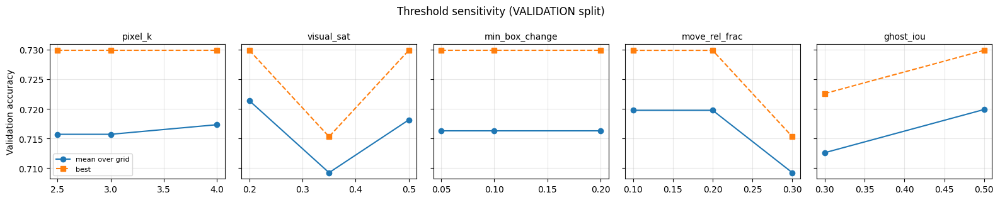

In [51]:
from itertools import product

val_cache = [c for c in detection_cache if c['split'] == 'validation']
test_cache = [c for c in detection_cache if c['split'] == 'test']


TUNING_GRID = {
    'pixel_k':        [2.5, 3.0, 4.0],
    'visual_sat':     [0.20, 0.35, 0.50],
    'min_box_change': [0.05, 0.10, 0.20],
    'move_rel_frac':  [0.10, 0.20, 0.30],
    'ghost_iou':      [0.30, 0.50],
}

tuning_rows = []
for combo in product(*TUNING_GRID.values()):
    trial = {**DEFAULT_PARAMS, **dict(zip(TUNING_GRID, combo))}
    _, trial_summary, _ = build_events_df(val_cache, trial)
    tuning_rows.append({**dict(zip(TUNING_GRID, combo)), **pair_metrics(trial_summary)})

tuning_df = (pd.DataFrame(tuning_rows)
             .sort_values(['accuracy', 'macro_f1', 'type_and_object_acc'], ascending=False, kind='stable')
             .reset_index(drop=True))
best_row = tuning_df.iloc[0]
FINAL_PARAMS = {**DEFAULT_PARAMS, **{k: float(best_row[k]) for k in TUNING_GRID}}

print(f"Searched {len(tuning_df)} threshold combinations on the {len(val_cache)} VALIDATION pairs.")
print("Top 10 (validation):")
display(tuning_df.head(10).round(3))
print("Chosen thresholds:", {k: FINAL_PARAMS[k] for k in TUNING_GRID})


fig, axes = plt.subplots(1, len(TUNING_GRID), figsize=(3.2 * len(TUNING_GRID), 3.2), sharey=True)
for ax, key in zip(axes, TUNING_GRID):
    g = tuning_df.groupby(key)['accuracy'].agg(['mean', 'max'])
    ax.plot(g.index, g['mean'], 'o-', label='mean over grid')
    ax.plot(g.index, g['max'], 's--', label='best')
    ax.set_title(key, fontsize=10); ax.grid(alpha=0.3)
axes[0].set_ylabel('Validation accuracy'); axes[0].legend(fontsize=8)
plt.suptitle('Threshold sensitivity (VALIDATION split)')
plt.tight_layout()
plt.savefig('/content/threshold_sensitivity_val.png', dpi=150)
plt.show()

### 11c. Final run with the tuned thresholds

In [52]:
events_df, pairs_summary_df, pair_contexts = build_events_df(detection_cache, FINAL_PARAMS)

print(f"{len(detection_cache)} pairs -> {len(events_df)} candidate object-level change events "
      f"({int(events_df['is_final_change'].sum())} pass the {FINAL_PARAMS['prob_threshold']*100:.0f}% "
      f"final-decision threshold).")
print(f"Pairs decided by the low-confidence fallback pass: "
      f"{(pairs_summary_df['decision_pass'] != 'strict').sum()}")

# ---- demo pair ----
demo_result = detect_changes(demo_entry, FINAL_PARAMS)
demo_reference_boxes, demo_query_boxes = demo_result['reference_boxes'], demo_result['query_boxes']
demo_H, demo_residual_px = demo_result['H'], demo_result['residual_px']
demo_move_thresh = demo_result['move_thresh']
demo_image_diag = demo_entry['image_diag']
demo_events, demo_matched_pairs = demo_result['events'], demo_result['matched_pairs']
demo_suppressed, demo_decision = demo_result['suppressed'], demo_result['decision']
demo_stats = summarize_events(demo_events, demo_matched_pairs)
demo_ctx = {'stats': demo_stats, 'matched_pairs': demo_matched_pairs, 'events': demo_events,
            'suppressed': demo_suppressed, 'decision': demo_decision, 'pass': demo_result['pass']}

print(f"\nDemo pair: {len(demo_reference_boxes)} reference box(es), {len(demo_query_boxes)} query box(es), "
      f"{len(demo_matched_pairs)} matched, {len(demo_events)} candidate change event(s), "
      f"{len(demo_suppressed)} cross-class pair(s) suppressed as detector noise  [{demo_result['pass']} pass].")
print(f"FINAL DECISION -- {demo_decision['summary']}")

915 pairs -> 1495 candidate object-level change events (1105 pass the 60% final-decision threshold).
Pairs decided by the low-confidence fallback pass: 25

Demo pair: 5 reference box(es), 5 query box(es), 5 matched, 1 candidate change event(s), 0 cross-class pair(s) suppressed as detector noise  [strict pass].
FINAL DECISION -- 1 object change detected: 'Bottle' -- Move (84%)


## 12. Matching Algorithm — Input and Output

**Input:** YOLO boxes (class, bbox, confidence) for reference and query -- confident boxes create events, weak ones
(0.10–0.40) are evidence only -- the homography `H` (reference → query), the thresholds, the appearance histograms
and the pixel change map.
**Output:** `matched_pairs` (with a role: unchanged / Move / one-sided Move turned into Add or Delete) and `events` —
the per-object Add / Delete / Move labels, each with its change-probability and visual-change fraction.

In [53]:
pos_by_pair_id = {c['pair_id']: i for i, c in enumerate(detection_cache)}

def move_thresh_for(c):
    return adaptive_move_thresh(c['residual_px'], MOVE_MIN_THRESH, MOVE_SAFETY_FACTOR)

def boxes_df(boxes):
    return pd.DataFrame(
        [{'class': b['class'], 'x1': round(b['bbox'][0]), 'y1': round(b['bbox'][1]),
          'x2': round(b['bbox'][2]), 'y2': round(b['bbox'][3]),
          'confidence': round(b['confidence'], 3)} for b in boxes],
        columns=['class', 'x1', 'y1', 'x2', 'y2', 'confidence'])

def matching_output_tables(ctx, move_thresh=None):
    matched_df = pd.DataFrame(
        [{'class': b['class'],
          'reference_bbox': [round(v) for v in b['bbox']],
          'query_bbox': [round(v) for v in a['bbox']],
          'moved_px': round(dist, 1),
          'appearance_sim': round(sim, 2),
          'role': role}
         for b, a, dist, sim, role in ctx['matched_pairs']],
        columns=['class', 'reference_bbox', 'query_bbox', 'moved_px', 'appearance_sim', 'role'])

    final_ids = {id(e) for e in ctx['decision']['changes']} if 'decision' in ctx else set()
    events_df = pd.DataFrame(
        [{'change_type': e['type'], 'object': e['object'],
          'probability_pct': round(e['probability'] * 100, 1),
          'confidence': round(e['confidence'], 3), 'movement_px': round(e['movement'], 1),
          'visual_change_pct': None if e.get('visual_change') is None else round(e['visual_change'] * 100, 1),
          'ghost': e.get('ghost', False),
          'final_decision': 'YES' if id(e) in final_ids else 'no (below threshold)',
          'note': e.get('note', '')}
         for e in sorted(ctx['events'], key=lambda e: -e['probability'])],
        columns=['change_type', 'object', 'probability_pct', 'confidence', 'movement_px',
                 'visual_change_pct', 'ghost', 'final_decision', 'note'])

    suppressed_df = pd.DataFrame(ctx.get('suppressed', []),
        columns=['ref_class', 'qry_class', 'iou', 'note'])

    return matched_df, events_df, suppressed_df

def annotate_side(img_bgr, boxes, matched_ids, move_ids, side):
    out = img_bgr.copy()
    for b in boxes:
        x1, y1, x2, y2 = b['bbox']
        if id(b) in move_ids:
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Move", (0, 140, 255))
        elif id(b) in matched_ids:
            draw_labeled_box(out, x1, y1, x2, y2, b['class'], (160, 160, 160), box_thickness=2)
        elif side == 'reference':
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Delete", (0, 0, 255))
        else:
            draw_labeled_box(out, x1, y1, x2, y2, f"{b['class']} - Add", (0, 180, 0))
    return out

### 12a. Matching input

In [54]:
print("Matching input -- demo pair")
print(f"H (reference -> query):\n{np.array2string(demo_H, precision=4, suppress_small=True)}")
print(f"camera_shift_residual = {demo_residual_px:.2f}px  |  base move_thresh = {demo_move_thresh:.1f}px  |  "
      f"image_diag = {demo_image_diag:.1f}px")
print(f"max_match_dist_frac = {FINAL_PARAMS['max_match_dist_frac']}  |  min_appearance_sim = {FINAL_PARAMS['min_appearance_sim']}  |  "
      f"recovery_appearance_sim = {FINAL_PARAMS['recovery_sim']}  |  cross_class_suppress_iou = {FINAL_PARAMS['cross_class_suppress_iou']}")
print(f"cost weights -- w_dist={FINAL_PARAMS['w_dist']}  w_iou={FINAL_PARAMS['w_iou']}  w_app={FINAL_PARAMS['w_app']}")
print(f"pixel evidence -- pixel_k={FINAL_PARAMS['pixel_k']}  visual_sat={FINAL_PARAMS['visual_sat']}  "
      f"min_box_change={FINAL_PARAMS['min_box_change']}  ghost_iou={FINAL_PARAMS['ghost_iou']}  "
      f"move_rel_frac={FINAL_PARAMS['move_rel_frac']}")

print(f"\nReference boxes ({len(demo_reference_boxes)} confident):")
display(boxes_df(demo_reference_boxes))
print(f"Query boxes ({len(demo_query_boxes)} confident):")
display(boxes_df(demo_query_boxes))

Matching input -- demo pair
H (reference -> query):
[[    0.99999  0.00011332   -0.018324]
 [ 5.5643e-06      1.0002    0.025168]
 [-7.0858e-08  2.1834e-07           1]]
camera_shift_residual = 0.08px  |  base move_thresh = 15.0px  |  image_diag = 2202.9px
max_match_dist_frac = 0.35  |  min_appearance_sim = 0.2  |  recovery_appearance_sim = 0.55  |  cross_class_suppress_iou = 0.5
cost weights -- w_dist=0.55  w_iou=0.2  w_app=0.25
pixel evidence -- pixel_k=4.0  visual_sat=0.5  min_box_change=0.05  ghost_iou=0.5  move_rel_frac=0.1

Reference boxes (5 confident):


,class,x1,y1,x2,y2,confidence
0,Pillow,396,616,797,850,0.834
1,Pillow,849,476,1342,627,0.816
2,Bottle,408,558,480,723,0.798
3,Pillow,1211,689,1499,883,0.787
4,Pillow,869,600,1372,733,0.711


Query boxes (5 confident):


,class,x1,y1,x2,y2,confidence
0,Pillow,399,621,781,844,0.829
1,Bottle,654,625,743,843,0.829
2,Pillow,1212,689,1498,883,0.804
3,Pillow,848,476,1343,628,0.772
4,Pillow,867,599,1372,733,0.720


### 12b. Matching output

In [55]:
matched_df, candidate_events_df, suppressed_df = matching_output_tables(demo_ctx)

print(f"Matching output -- demo pair: {len(matched_df)} matched pair(s), {len(demo_events)} candidate event(s), "
      f"{len(demo_suppressed)} cross-class pair(s) suppressed as detector noise.")
print("\nMatched pairs (per-class Hungarian assignment, incl. recovered / merged same-object Moves):")
display(matched_df)

print("\nCandidate change events, ranked by change-probability (this is BEFORE the final decision filter):")
display(candidate_events_df)

if len(suppressed_df):
    print("\nCross-class pairs suppressed as likely detector class-flip noise (not reported as Add+Delete):")
    display(suppressed_df)

Matching output -- demo pair: 5 matched pair(s), 1 candidate event(s), 0 cross-class pair(s) suppressed as detector noise.

Matched pairs (per-class Hungarian assignment, incl. recovered / merged same-object Moves):


,class,reference_bbox,query_bbox,moved_px,appearance_sim,role
0,Bottle,"[408, 558, 480, 723]","[654, 625, 743, 843]",271.5,0.36,Move
1,Pillow,"[396, 616, 797, 850]","[399, 621, 781, 844]",6.5,0.91,unchanged
2,Pillow,"[849, 476, 1342, 627]","[848, 476, 1343, 628]",0.3,1.00,unchanged
3,Pillow,"[1211, 689, 1499, 883]","[1212, 689, 1498, 883]",0.3,0.84,unchanged
4,Pillow,"[869, 600, 1372, 733]","[867, 599, 1372, 733]",1.6,0.98,unchanged



Candidate change events, ranked by change-probability (this is BEFORE the final decision filter):


,change_type,object,probability_pct,confidence,movement_px,visual_change_pct,ghost,final_decision,note
0,Move,Bottle,83.6,0.814,271.5,45.0,False,YES,


## 13. Per-Object Change Events (Add / Delete / Move) -- with change-probability & final decision



### 13a. Events across the dataset

In [56]:
print(f"{len(events_df)} total CANDIDATE change events across {len(detection_cache)} pairs")
print(f"{int(events_df['is_final_change'].sum())} events pass the {FINAL_PARAMS['prob_threshold']*100:.0f}% "
      f"final-decision threshold and are actually reported as changes")
print()
print("Candidate events by type:")
print(events_df['change_type'].value_counts())
print("\nFinal (reported) events by type:")
print(events_df[events_df['is_final_change']]['change_type'].value_counts())

print(f"\nPairs with more than one CANDIDATE event: {(pairs_summary_df['n_events'] > 1).sum()} / {len(pairs_summary_df)}")
print(f"Pairs with more than one FINAL (reported) change: {(pairs_summary_df['n_final_changes'] > 1).sum()} / {len(pairs_summary_df)}")
print(f"Pairs with at least one cross-class pair suppressed as detector noise: "
      f"{(pairs_summary_df['n_suppressed_cross_class'] > 0).sum()} / {len(pairs_summary_df)}")
print(f"Pairs decided by the low-confidence fallback pass: "
      f"{(pairs_summary_df['decision_pass'] != 'strict').sum()} / {len(pairs_summary_df)}")

events_df.groupby('split')['change_type'].value_counts().unstack(fill_value=0)

1495 total CANDIDATE change events across 915 pairs
1105 events pass the 60% final-decision threshold and are actually reported as changes

Candidate events by type:
change_type
Add       558
Delete    546
Move      391
Name: count, dtype: int64

Final (reported) events by type:
change_type
Add       384
Delete    380
Move      341
Name: count, dtype: int64

Pairs with more than one CANDIDATE event: 333 / 915
Pairs with more than one FINAL (reported) change: 178 / 915
Pairs with at least one cross-class pair suppressed as detector noise: 8 / 915
Pairs decided by the low-confidence fallback pass: 25 / 915


change_type,Add,Delete,Move
split,,,
test,100,93,52
train,359,359,294
validation,99,94,45


### 13b. Demo pair -- full multi-object event list, change-probability & final decision


In [57]:
demo_events_df = pd.DataFrame(
    [{'object': e['object'], 'change_type': e['type'],
      'probability_pct': round(e['probability'] * 100, 1),
      'confidence': round(e['confidence'], 3), 'movement_px': round(e['movement'], 1),
      'visual_change_pct': None if e.get('visual_change') is None else round(e['visual_change'] * 100, 1),
      'final_decision': 'YES' if any(e is c for c in demo_decision['changes']) else 'no (below threshold)'}
     for e in sorted(demo_events, key=lambda e: -e['probability'])],
    columns=['object', 'change_type', 'probability_pct', 'confidence', 'movement_px', 'visual_change_pct',
             'final_decision'])

print(f"--- Demo pair: {len(demo_events_df)} candidate change event(s), "
      f"{len(demo_decision['changes'])} pass the {FINAL_PARAMS['prob_threshold']*100:.0f}% threshold "
      f"[{demo_ctx['pass']} pass] ---")
display(demo_events_df)

print(f"\nFINAL DECISION: {demo_decision['summary']}")

--- Demo pair: 1 candidate change event(s), 1 pass the 60% threshold [strict pass] ---


,object,change_type,probability_pct,confidence,movement_px,visual_change_pct,final_decision
0,Bottle,Move,83.6,0.814,271.5,45.0,YES



FINAL DECISION: 1 object change detected: 'Bottle' -- Move (84%)


## 14. Final Evaluation (TEST split)



### 14a. Confusion matrix

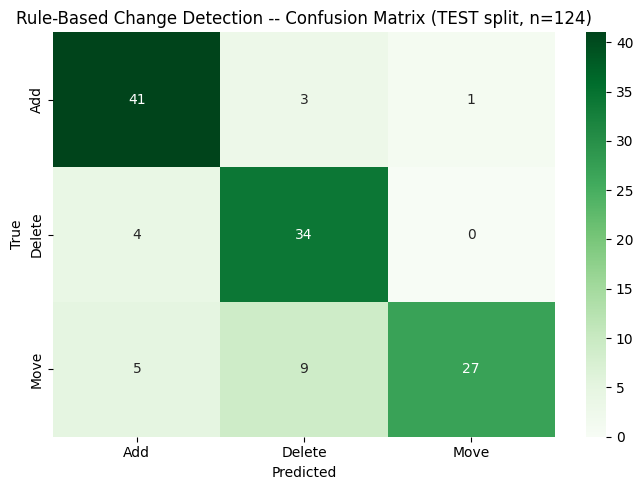

              precision    recall  f1-score   support

         Add       0.82      0.82      0.82        50
      Delete       0.74      0.79      0.76        43
        Move       0.96      0.60      0.74        45

   micro avg       0.82      0.74      0.78       138
   macro avg       0.84      0.74      0.77       138
weighted avg       0.84      0.74      0.78       138

Accuracy over ALL 138 test pairs ('None' = wrong): 0.739
Coverage (pairs where a change was reported):   0.899
Accuracy on the answered pairs only:            0.823
Change type AND object both correct:            0.609


In [63]:
test_summary = pairs_summary_df[pairs_summary_df['split'] == 'test']
y_test = test_summary['true_change']
test_pred = test_summary['predicted_change']
labels_sorted = CHANGE_LABELS


mask = test_pred != 'None'
y_test_cm = y_test[mask]
test_pred_cm = test_pred[mask]

cm = confusion_matrix(y_test_cm, test_pred_cm, labels=CHANGE_LABELS)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=CHANGE_LABELS, yticklabels=CHANGE_LABELS)
plt.xlabel('Predicted'); plt.ylabel('True')
plt.title(f'Rule-Based Change Detection -- Confusion Matrix (TEST split, n={len(y_test_cm)})')
plt.tight_layout()
plt.savefig('/content/change_confusion_matrix_rules.png', dpi=150)
plt.show()

test_report = classification_report(y_test, test_pred, labels=CHANGE_LABELS,
                                    output_dict=True, zero_division=0)
test_metrics = pair_metrics(test_summary)
test_report['accuracy'] = test_metrics['accuracy']
print(classification_report(y_test, test_pred, labels=CHANGE_LABELS, zero_division=0))

answered = test_pred != 'None'
print(f"Accuracy over ALL {len(y_test)} test pairs ('None' = wrong): {test_metrics['accuracy']:.3f}")
print(f"Coverage (pairs where a change was reported):   {test_metrics['coverage']:.3f}")
print(f"Accuracy on the answered pairs only:            {(y_test[answered] == test_pred[answered]).mean():.3f}")
print(f"Change type AND object both correct:            {test_metrics['type_and_object_acc']:.3f}")

### 14b. Precision / recall / F1 per class

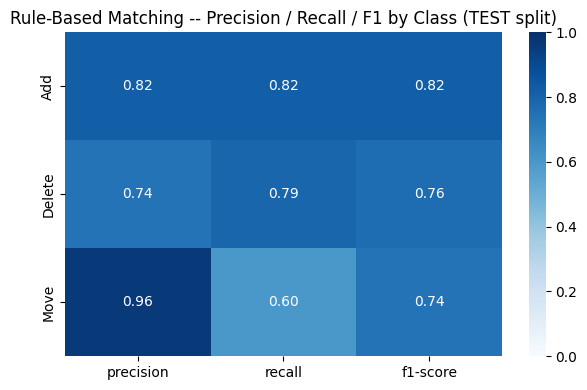

In [64]:
report_df = pd.DataFrame(test_report).transpose().loc[labels_sorted, ['precision', 'recall', 'f1-score']]

plt.figure(figsize=(6, 4))
sns.heatmap(report_df, annot=True, fmt='.2f', cmap='Blues', vmin=0, vmax=1)
plt.title('Rule-Based Matching -- Precision / Recall / F1 by Class (TEST split)')
plt.tight_layout()
plt.savefig('/content/classification_report_heatmap.png', dpi=150)
plt.show()


### 14c. Events per pair (multi-object detections)

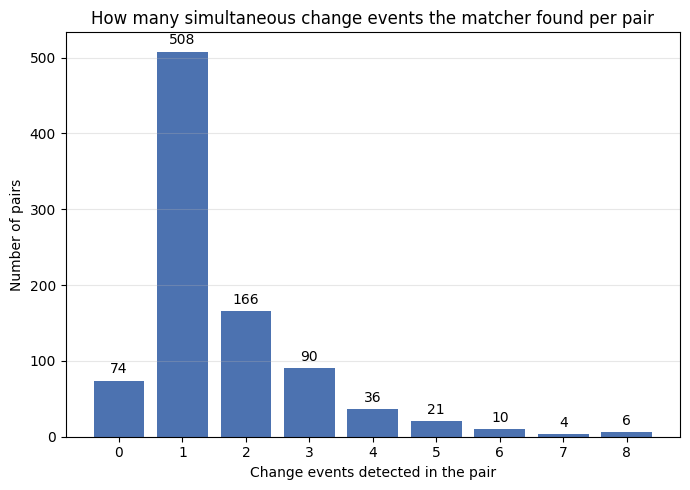

In [65]:
fig, ax = plt.subplots(figsize=(7, 5))
counts = pairs_summary_df['n_events'].value_counts().sort_index()
bars = ax.bar(counts.index.astype(str), counts.values, color='#4C72B0')
ax.bar_label(bars, padding=3)
ax.set_xlabel('Change events detected in the pair')
ax.set_ylabel('Number of pairs')
ax.set_title('How many simultaneous change events the matcher found per pair')
ax.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('/content/events_per_pair.png', dpi=150)
plt.show()


### 14d. Prediction distribution and errors

In [67]:
print("True change distribution by split:")
print(pairs_summary_df.groupby('split')['true_change'].value_counts().unstack(fill_value=0))
print("\nPredicted (primary-event) change distribution by split:")
print(pairs_summary_df.groupby('split')['predicted_change'].value_counts().unstack(fill_value=0))


True change distribution by split:
true_change  Add  Delete  Move
split                         
test          50      43    45
train        232     199   209
validation    50      43    44

Predicted (primary-event) change distribution by split:
predicted_change  Add  Delete  Move  None
split                                    
test               50      46    28    14
train             209     202   166    63
validation         50      44    31    12


In [68]:
test_rows = pairs_summary_df[pairs_summary_df['split'] == 'test']
wrong = test_rows[test_rows['true_change'] != test_rows['predicted_change']]
print(f"{len(wrong)} / {len(test_rows)} TEST pairs misclassified (primary-event vs. ground truth)")
wrong[['pair_id', 'true_change', 'predicted_change', 'predicted_change_prob',
       'true_object', 'predicted_object', 'n_events', 'n_final_changes']].head(15)


36 / 138 TEST pairs misclassified (primary-event vs. ground truth)


,pair_id,true_change,predicted_change,predicted_change_prob,true_object,predicted_object,n_events,n_final_changes
11,0070,Move,Delete,0.882,book,Glass,3,1
17,0076,Delete,None,0.000,bag,None,0,0
20,0079,Move,Add,0.866,book,Notebook,2,2
35,0094,Delete,Add,0.898,chair,Footwear,5,3
37,0096,Add,None,0.000,clock,None,1,0
38,0097,Move,Delete,0.971,clock,Clock,1,1
39,0098,Move,Add,0.980,clock,Bag,5,4
138,0208,Move,Delete,0.971,plate,Jar,5,5
192,0265,Add,Delete,0.669,bag,Bag,1,1
223,0298,Add,None,0.000,basket,None,1,0


### 14e. Overall system performance

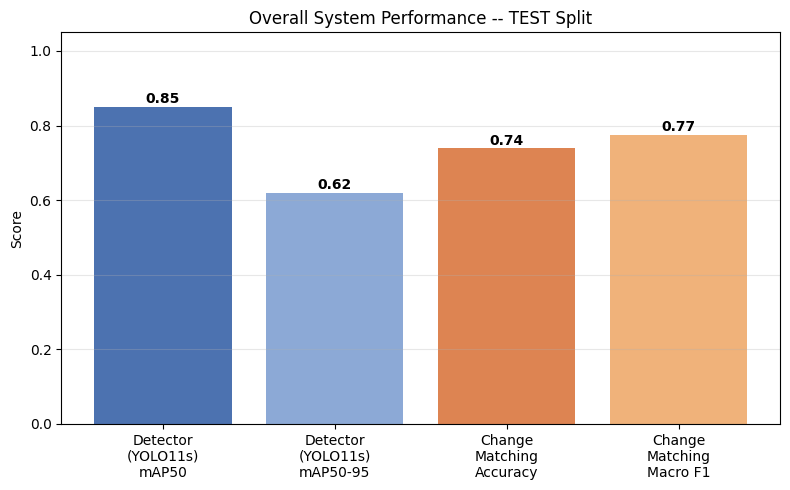

In [69]:
system_summary = pd.DataFrame([
    {'component': 'Detector\n(YOLO11s)', 'metric': 'mAP50',    'score': yolo_test_metrics['mAP50']},
    {'component': 'Detector\n(YOLO11s)', 'metric': 'mAP50-95', 'score': yolo_test_metrics['mAP50-95']},
    {'component': 'Change\nMatching',    'metric': 'Accuracy', 'score': test_report['accuracy']},
    {'component': 'Change\nMatching',    'metric': 'Macro F1', 'score': test_report['macro avg']['f1-score']},
])
colors_map = {'mAP50': '#4C72B0', 'mAP50-95': '#8CA9D6', 'Accuracy': '#DD8452', 'Macro F1': '#F0B27A'}

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(system_summary['component'] + '\n' + system_summary['metric'], system_summary['score'],
              color=[colors_map[m] for m in system_summary['metric']])
for b, v in zip(bars, system_summary['score']):
    ax.text(b.get_x() + b.get_width() / 2, v + 0.01, f'{v:.2f}', ha='center', fontweight='bold')
ax.set_ylim(0, 1.05)
ax.set_ylabel('Score')
ax.set_title('Overall System Performance -- TEST Split')
ax.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('/content/system_performance_summary.png', dpi=150)
plt.show()


## 15. End-to-End Pipeline Trace (your demo pair)

What each stage receives and returns, all for the single reference/query pair you uploaded at the top:

1. **Raw input** — your uploaded reference / query photos.
2. **Preprocessed input** — the same pair after CLAHE; this is what YOLO sees.
3. **YOLO output** — `{class, bbox, confidence}` per box, for reference and query.
4. **Matching input** — the two box lists, homography `H`, thresholds, appearance histograms, pixel change map.
5. **Pixel-change evidence** — where the aligned pair actually differs (used to verify every candidate).
6. **Matching output** — `matched_pairs` and `events`, each event with its change-probability.
7. **Final decision** — the events that clear the threshold.

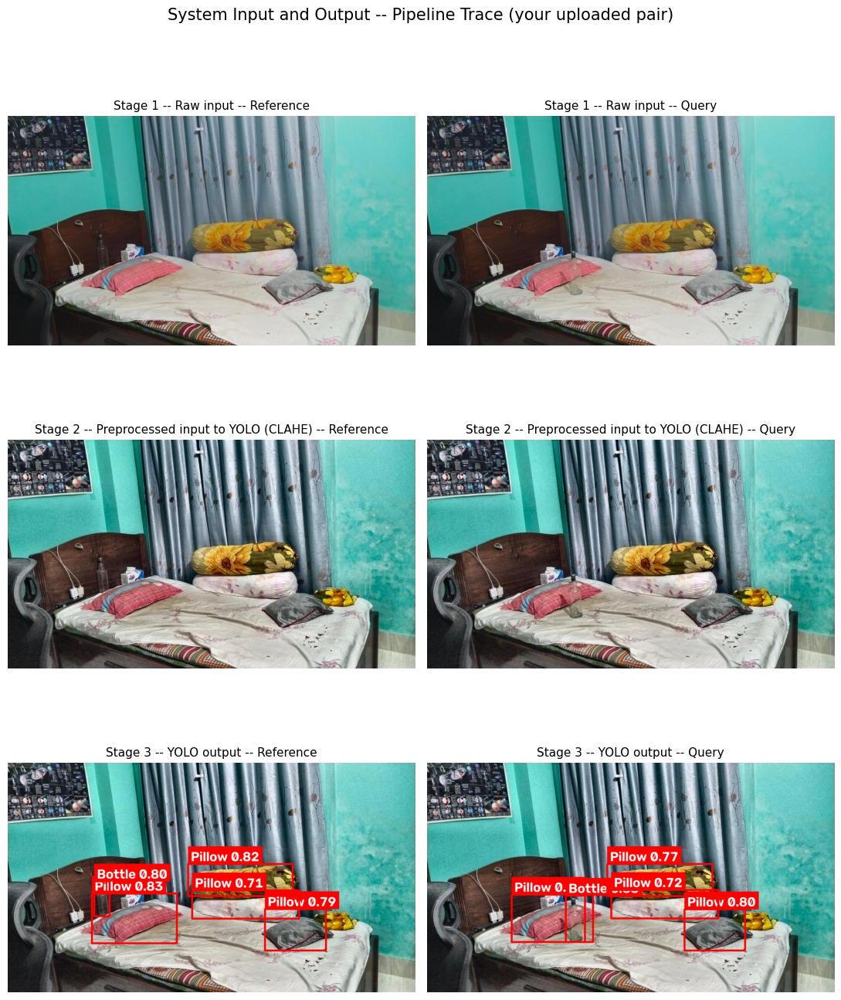

Stage 3 -- YOLO output: reference_boxes (5), query_boxes (5)


,class,x1,y1,x2,y2,confidence
0,Pillow,396,616,797,850,0.834
1,Pillow,849,476,1342,627,0.816
2,Bottle,408,558,480,723,0.798
3,Pillow,1211,689,1499,883,0.787
4,Pillow,869,600,1372,733,0.711


,class,x1,y1,x2,y2,confidence
0,Pillow,399,621,781,844,0.829
1,Bottle,654,625,743,843,0.829
2,Pillow,1212,689,1498,883,0.804
3,Pillow,848,476,1343,628,0.772
4,Pillow,867,599,1372,733,0.720



Stage 4 -- Matching input
H (reference -> query):
[[    0.99999  0.00011332   -0.018324]
 [ 5.5643e-06      1.0002    0.025168]
 [-7.0858e-08  2.1834e-07           1]]
camera_shift_residual = 0.08px  |  base move_thresh = 15.0px  |  image_diag = 2202.9px
pixel_k = 4.0  |  visual_sat = 0.5  |  min_box_change = 0.05  |  ghost_iou = 0.5
reference_img = pixel array (1080, 1920, 3)  |  query_img = pixel array (1080, 1920, 3)


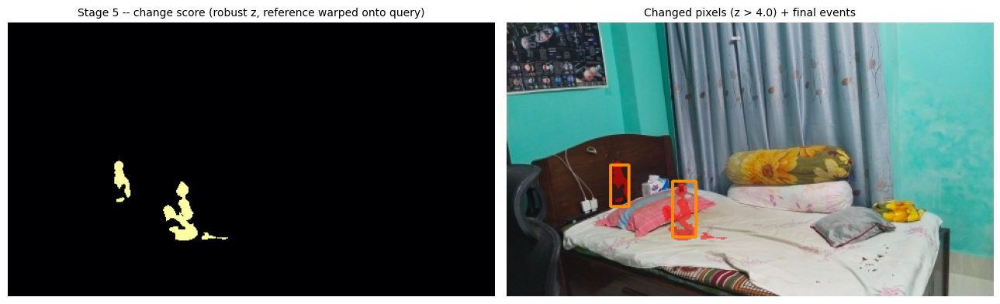

Stage 5 -- 1.0% of the comparable image area changed.

Stage 6 -- Matching output: matched_pairs (5), candidate events (1), cross-class pairs suppressed as noise (0)


,class,reference_bbox,query_bbox,moved_px,appearance_sim,role
0,Bottle,"[408, 558, 480, 723]","[654, 625, 743, 843]",271.5,0.36,Move
1,Pillow,"[396, 616, 797, 850]","[399, 621, 781, 844]",6.5,0.91,unchanged
2,Pillow,"[849, 476, 1342, 627]","[848, 476, 1343, 628]",0.3,1.00,unchanged
3,Pillow,"[1211, 689, 1499, 883]","[1212, 689, 1498, 883]",0.3,0.84,unchanged
4,Pillow,"[869, 600, 1372, 733]","[867, 599, 1372, 733]",1.6,0.98,unchanged



All candidate change events, ranked by change-probability:


,change_type,object,probability_pct,confidence,movement_px,visual_change_pct,ghost,final_decision,note
0,Move,Bottle,83.6,0.814,271.5,45.0,False,YES,



Stage 7 -- Final decision (threshold = 60%, strict pass)
1 object change detected: 'Bottle' -- Move (84%)


,object,change_type,probability_pct
0,Bottle,Move,83.6


In [70]:
def to_rgb(img_bgr):
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

def draw_yolo(img_bgr, boxes):
    out = img_bgr.copy()
    for b in boxes:
        draw_labeled_box(out, *b['bbox'], f"{b['class']} {b['confidence']:.2f}", (0, 0, 255))
    return out

# ---- Stages 1-3: raw, preprocessed and YOLO-output images (reusing what was already computed above) ----
stages = [
    ("Stage 1 -- Raw input", cv2.imread(USER_REFERENCE_PATH), cv2.imread(USER_QUERY_PATH)),
    ("Stage 2 -- Preprocessed input to YOLO (CLAHE)", demo_reference_pre, demo_query_pre),
    ("Stage 3 -- YOLO output", draw_yolo(demo_reference_pre, demo_reference_boxes), draw_yolo(demo_query_pre, demo_query_boxes)),
]
fig, axes = plt.subplots(len(stages), 2, figsize=(11, 4.6 * len(stages)))
for r, (label, b_img, a_img) in enumerate(stages):
    axes[r, 0].imshow(to_rgb(b_img)); axes[r, 0].axis('off'); axes[r, 0].set_title(f"{label} -- Reference", fontsize=11)
    axes[r, 1].imshow(to_rgb(a_img)); axes[r, 1].axis('off'); axes[r, 1].set_title(f"{label} -- Query", fontsize=11)
plt.suptitle("System Input and Output -- Pipeline Trace (your uploaded pair)", fontsize=15, y=1.0)
plt.tight_layout()
plt.savefig('/content/system_input_output_trace_user.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Stage 3 -- YOLO output: reference_boxes ({len(demo_reference_boxes)}), query_boxes ({len(demo_query_boxes)})")
display(boxes_df(demo_reference_boxes))
display(boxes_df(demo_query_boxes))

# ---- Stage 4: matching input ----
print("\nStage 4 -- Matching input")
print("H (reference -> query):")
print(np.array2string(demo_H, precision=4, suppress_small=True))
print(f"camera_shift_residual = {demo_residual_px:.2f}px  |  base move_thresh = {demo_move_thresh:.1f}px  |  "
      f"image_diag = {demo_image_diag:.1f}px")
print(f"pixel_k = {FINAL_PARAMS['pixel_k']}  |  visual_sat = {FINAL_PARAMS['visual_sat']}  |  "
      f"min_box_change = {FINAL_PARAMS['min_box_change']}  |  ghost_iou = {FINAL_PARAMS['ghost_iou']}")
print(f"reference_img = pixel array {demo_reference_pre.shape}  |  query_img = pixel array {demo_query_pre.shape}")

# ---- Stage 5: pixel-change evidence ----
demo_change = demo_result['change']
if demo_change is not None:
    k = FINAL_PARAMS['pixel_k']
    mask = changed_mask(demo_change, k)
    s = demo_change['scale']
    qry_small = cv2.resize(demo_query_bgr, (mask.shape[1], mask.shape[0]), interpolation=cv2.INTER_AREA)
    overlay = qry_small.copy()
    overlay[mask] = (0.45 * overlay[mask] + 0.55 * np.array([0, 0, 255])).astype(np.uint8)
    colours = {'Add': (0, 180, 0), 'Delete': (0, 0, 255), 'Move': (0, 140, 255)}
    for e in demo_decision['changes']:
        for key, H_box in (('bbox_ref', demo_H), ('bbox_qry', None)):
            if key in e:
                x1, y1, x2, y2 = [int(round(v * s)) for v in (warp_bbox(e[key], H_box) if H_box is not None else e[key])]
                cv2.rectangle(overlay, (x1, y1), (x2, y2), colours[e['type']], 2)
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.2))
    axes[0].imshow(np.clip(demo_change['score'].astype(np.float32) / (3 * k), 0, 1), cmap='inferno')
    axes[0].set_title('Stage 5 -- change score (robust z, reference warped onto query)', fontsize=10)
    axes[1].imshow(to_rgb(overlay))
    axes[1].set_title(f'Changed pixels (z > {k}) + final events', fontsize=10)
    for ax in axes:
        ax.axis('off')
    plt.tight_layout()
    plt.savefig('/content/demo_change_map.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"Stage 5 -- {mask.mean() * 100:.1f}% of the comparable image area changed.")

# ---- Stage 6: matching output -- every CANDIDATE event with its change-probability ----
matched_df, candidate_events_df, suppressed_df = matching_output_tables(demo_ctx)
print(f"\nStage 6 -- Matching output: matched_pairs ({len(matched_df)}), candidate events ({len(demo_events)}), "
      f"cross-class pairs suppressed as noise ({len(demo_suppressed)})")
display(matched_df)
print("\nAll candidate change events, ranked by change-probability:")
display(candidate_events_df)
if len(suppressed_df):
    print("\nSuppressed as likely detector class-flip noise (not reported):")
    display(suppressed_df)

# ---- Stage 7: FINAL DECISION -- the events that actually cleared the threshold ----
print(f"\nStage 7 -- Final decision (threshold = {FINAL_PARAMS['prob_threshold']*100:.0f}%, {demo_ctx['pass']} pass)")
print(demo_decision['summary'])
if demo_decision['has_change']:
    final_decision_df = pd.DataFrame(
        [{'object': e['object'], 'change_type': e['type'], 'probability_pct': round(e['probability'] * 100, 1)}
         for e in demo_decision['changes']],
        columns=['object', 'change_type', 'probability_pct'])
    display(final_decision_df)

## 16. Export

### 16a. Results CSV (per-event and per-pair)

In [71]:
events_df.to_csv('/content/events_full.csv', index=False)
pairs_summary_df.to_csv('/content/results_full_with_predictions.csv', index=False)
print("Saved: events_full.csv (one row per detected change event) and "
      "results_full_with_predictions.csv (one row per pair, primary event vs. ground truth).")


Saved: events_full.csv (one row per detected change event) and results_full_with_predictions.csv (one row per pair, primary event vs. ground truth).


### 16b. Flask deployment bundle

In [72]:
DEPLOY_DIR = '/content/deploy'
shutil.rmtree(DEPLOY_DIR, ignore_errors=True)
os.makedirs(DEPLOY_DIR)

shutil.copy(YOLO_WEIGHTS, os.path.join(DEPLOY_DIR, 'best.pt'))

def _jsonable(v):
    return float(v) if isinstance(v, (np.floating, np.integer)) else v

deploy_config = {
    # v40 keys (unchanged names, so an existing Flask app still finds them)
    'conf_thresh': FINAL_PARAMS['conf_thresh'],
    'move_min_thresh': FINAL_PARAMS['move_min_thresh'],
    'move_safety_factor': FINAL_PARAMS['move_safety_factor'],
    'max_match_dist_frac': FINAL_PARAMS['max_match_dist_frac'],
    'min_appearance_sim': FINAL_PARAMS['min_appearance_sim'],
    'w_dist': FINAL_PARAMS['w_dist'], 'w_iou': FINAL_PARAMS['w_iou'], 'w_app': FINAL_PARAMS['w_app'],
    'recovery_appearance_sim': FINAL_PARAMS['recovery_sim'],
    'cross_class_suppress_iou': FINAL_PARAMS['cross_class_suppress_iou'],
    'change_prob_threshold': FINAL_PARAMS['prob_threshold'],
    'clahe_clip_limit': CLAHE_CLIP_LIMIT,
    'clahe_tile_grid': list(CLAHE_TILE_GRID),
    'class_names': list(yolo_model.names.values()),
    # v41 rule parameters (the Flask app needs the v41 matching code to use these)
    'change_map_width': CHANGE_MAP_WIDTH, 'ssim_floor': SSIM_FLOOR, 'chroma_floor': CHROMA_FLOOR,
    'params': {k: _jsonable(v) for k, v in FINAL_PARAMS.items()},
}
with open(os.path.join(DEPLOY_DIR, 'config.json'), 'w') as f:
    json.dump(deploy_config, f, indent=2)

print("Deployment bundle (YOLO weights + matching config):", sorted(os.listdir(DEPLOY_DIR)))
shutil.make_archive('/content/flask_model_bundle', 'zip', '/content', 'deploy')
files.download('/content/flask_model_bundle.zip')   # unzip into flask_app/model/

Deployment bundle (YOLO weights + matching config): ['best.pt', 'config.json']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 16c. Results archive

In [73]:
RESULTS_DIR = '/content/results'
shutil.rmtree(RESULTS_DIR, ignore_errors=True)
os.makedirs(f'{RESULTS_DIR}/models/yolo11s')
os.makedirs(f'{RESULTS_DIR}/charts')

shutil.copy(YOLO_WEIGHTS, f'{RESULTS_DIR}/models/yolo11s/best.pt')
for png in glob.glob('/content/*.png'):                       # every chart saved by this notebook
    shutil.copy(png, f'{RESULTS_DIR}/charts/')
for pattern in ['events_full.csv', 'results_full_with_predictions.csv']:
    for path in glob.glob(f'/content/{pattern}'):
        shutil.copy(path, RESULTS_DIR)
shutil.copytree(DEPLOY_DIR, f'{RESULTS_DIR}/deploy')
comparison_df.to_csv(f'{RESULTS_DIR}/model_metrics_validation.csv', index=False)
comparison_test_df.to_csv(f'{RESULTS_DIR}/model_metrics_test.csv', index=False)
tuning_df.to_csv(f'{RESULTS_DIR}/rule_threshold_search_validation.csv', index=False)
ablation_df.to_csv(f'{RESULTS_DIR}/rule_ablation.csv', index=False)

shutil.make_archive('/content/results', 'zip', RESULTS_DIR)
files.download('/content/results.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>